In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

import sklearn
from sklearn.preprocessing import LabelEncoder

In [2]:
np.random.seed(42)

plt.rcParams['figure.figsize'] = (12, 8)
sns.set_theme(style='whitegrid')

pd.set_option('display.max_rows', None)

<h1 style="text-align: center">Ames House Price Prediction: Domain-driven EDA</h1>
<center><img style="height: 450px" src="https://livability.com/sites/default/files/151SUBAME031.jpg"></center>

<p style="text-align: center">
In this notebook, we will explore factores that impacted sale price of houses in Ames, Iowa. <br/>
The goal is to make sense of provided dataset and turn these insights into actions during the second modeling part. <br/>
Apart from that, we will try to describe the analysis in the <strong>domain-driven</strong> way and spend some time understanding meaning of features in the real estate field.
</p>

In [3]:
train_df = pd.read_csv('data/train.csv')
test_df = pd.read_csv('data/test.csv')

full_df = pd.concat([train_df, test_df], sort=True).reset_index(drop=True)

## Dataset Overview

Given dataset has:
* a vast number of features (**80**)
* a relatively small number of training examples (**2918**)

In [4]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   1stFlrSF       2919 non-null   int64  
 1   2ndFlrSF       2919 non-null   int64  
 2   3SsnPorch      2919 non-null   int64  
 3   Alley          198 non-null    object 
 4   BedroomAbvGr   2919 non-null   int64  
 5   BldgType       2919 non-null   object 
 6   BsmtCond       2837 non-null   object 
 7   BsmtExposure   2837 non-null   object 
 8   BsmtFinSF1     2918 non-null   float64
 9   BsmtFinSF2     2918 non-null   float64
 10  BsmtFinType1   2840 non-null   object 
 11  BsmtFinType2   2839 non-null   object 
 12  BsmtFullBath   2917 non-null   float64
 13  BsmtHalfBath   2917 non-null   float64
 14  BsmtQual       2838 non-null   object 
 15  BsmtUnfSF      2918 non-null   float64
 16  CentralAir     2919 non-null   object 
 17  Condition1     2919 non-null   object 
 18  Conditio

### House Features Overview

It's easy to get lost reviewing the list of available information. So we probably would like to group features somehow meaningfully.

* **House Properties**
    * Construction Date [YearBuilt]
    * Remodeling Date [YearRemodAdd]
    * Dwelling Class [BldgType] and Subclass [MSSubClass]
    * House Style [HouseStyle]
    * Area (sq. feets) [LotArea]
    * Shape [LotShape]
    * Flatness [LandContour] and slope [LandSlope]
    * Overral Material and Finish Quality Rate [OverallQual]
    * Overral Condition Rate [OverallCond]
    * Home Functionality [Functional]
* **Living Area**
    * Living Area Above Ground [GrLivArea]
    * Low finished living area [LowQualFinSF]
    * Total Rooms above grade (w/o bathrooms) [TotRmsAbvGrd]
    * First Floor Area [1stFlrSF]
    * Second Floor Area [2ndFlrSF]
    * Bedrooms above grade (w/o basement bedrooms) [BedroomAbvGr]
* **Kitchen**
    * Kitchen Above Grade [KitchenAbvGr]
    * Kitchen Quality [KitchenQual]
* **Bathroom**
    * Basement Full Bathroom [BsmtFullBath]
    * Basement Half Bathroom [BsmtHalfBath]
    * Full bathroom above grade [FullBath]
    * Half bathroom above grade [HalfBath]
* **Systems**
    * Heating Type [Heating]
    * Heating Quality and Condition Rate [HeatingQC]
    * Has Central Air Conditioning? [CentralAir]
    * Electrical System Type [Electrical]
    * Utilities (Gas, water, septic) [Utilities]
* **Fireplaces**
    * Number of fireplaces [Fireplaces]
    * Fireplace Quality [FireplaceQu]
* **Basement**
    * Foundation Type (stone, wood, etc) [Foundation]
    * Basement Quality [BsmtQual]
    * Basement Condition [BsmtCond]
    * Basement Exposure [BsmtExposure]
    * Basement finished area rating (1 or 2) [BsmtFinType1][BsmtFinType2]
    * Basement Finished area (1 or 2) [BsmtFinSF1] [BsmtFinSF2]
    * Basement Unfinished Area [BsmtUnfSF]
    * Total Basement Area [TotalBsmtSF]
* **Roof Properties**
    * Roof Style [RoofStyle]
    * Roof Material [RoofMatl]
* **Exterior**
    * Exterior Covering (1 or 2 materials) [Exterior1st] [Exterior2nd]
    * Exterior Material Quality [ExterQual]
    * Exterior Material Condition [ExterCond]
* **Masonry veneer**
    * Masonry Veneer Type [MasVnrType]
    * Masonry Veneer Area [MasVnrArea]
* **Garage**
    * Garage Type [GarageType]
    * Year Garage was built [GarageYrBlt]
    * Interior Finish of the garage [GarageFinish]
    * Garage Size (in cars) [GarageCars]
    * Garage Area [GarageArea]
    * Garage Quality [GarageQual]
    * Garage Condition [GarageCond]
* **Fence** [Fence]
* **Porch**
    * Wood Deck Area [WoodDeckSF]
    * Open Porch Area (in sq ft) [OpenPorchSF]
    * Enclosed Porch Area [EnclosedPorch]
    * 3 seasons porch area [3SsnPorch]
    * Screen Porch area [ScreenPorch]
* **Pool**
    * Pool area [PoolArea]
    * Pool Quality [PoolQC]
* **House Access**
    * Road Access [Street] [LotFrontage]
    * Alley Access [Alley]
    * House Road Connection [LotFrontage]
    * Paved driveway (paved, dirt, etc) [PavedDrive]
* **House Location**
    * Neighborhood (Physical Location) [Neighborhood]
    * Zoning classification [MSZoning]
    * Location Conditions (1 or 2) [Condition1][Condition2]
    * Place where house is located in neighborhood (like an inside or a corner lot) [LotConfig]
* **Miscellaneous Features** (elevator, 2nd garage, etc) [MiscFeature]
    * Miscellaneous Features Value in $ [MiscVal]
* **Sale Information**
    * Month Sold [MM]
    * Year Sold [YYYY]
    * Sale Type (Warranty Deed, new, etc) [SaleType]
    * Sale Condition (family sale, normal sale, etc) [SaleCondition]

With this number of features, we would like to quickly separate them into two groups by type: **numerical** and **categorical features**. This may be handy further during data exploration.

In [5]:
for dataframe in [train_df, test_df, full_df]:
    dataframe['MSSubClass'] = dataframe['MSSubClass'].apply(str)
    dataframe['YrSold'] = dataframe['YrSold'].astype(str)
    dataframe['MoSold'] = dataframe['MoSold'].astype(str)

In [6]:
num_features = [f for f in full_df.columns if full_df.dtypes[f] != 'object']
num_features.remove('Id')
num_features.remove('SalePrice')

cat_features = [f for f in full_df.columns if full_df.dtypes[f] == 'object']

## Missing Information

Let's check missing information in our dataset:

In [7]:
missing_df = full_df.isnull().sum()
missing_df = missing_df.drop(missing_df[missing_df == 0].index).sort_values(ascending=False)
missing_df.drop(['SalePrice'], inplace=True)

missing_df = pd.DataFrame({'missing_count': missing_df})
missing_df['missing_rate'] = (missing_df['missing_count'] / len(full_df)) * 100

Text(0.5, 1.0, 'Missing Data per Feature')

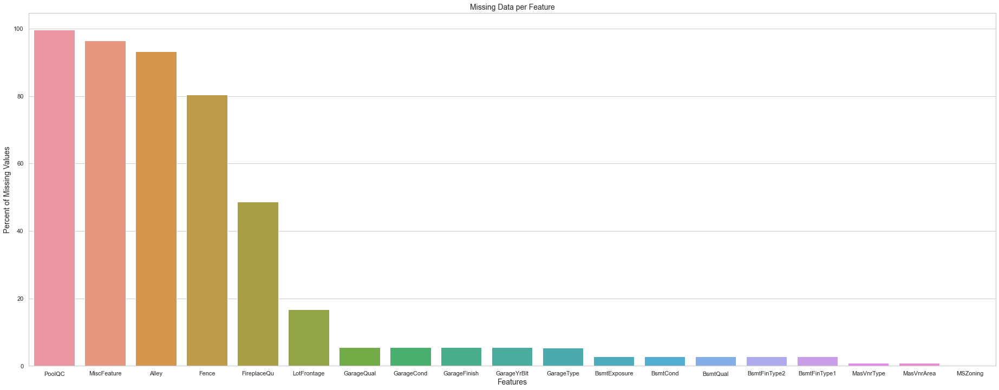

In [8]:
top_five_missing_df = missing_df[missing_df['missing_count'] > 3]

plt.figure(figsize=(32, 12))
sns.barplot(x=top_five_missing_df.index, y='missing_rate', data=top_five_missing_df)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Percent of Missing Values', fontsize=14)
plt.title('Missing Data per Feature', fontsize=14)

In [9]:
missing_df

,missing_count,missing_rate
PoolQC,2909,99.657417
MiscFeature,2814,96.402878
Alley,2721,93.216855
Fence,2348,80.438506
FireplaceQu,1420,48.646797
LotFrontage,486,16.649538
GarageQual,159,5.447071
GarageCond,159,5.447071
GarageFinish,159,5.447071
GarageYrBlt,159,5.447071


There are **34** features that are affected by missing values. Let's review them:
* **FireplaceQu**, **Garage{X}**, **Alley**, **PoolQC**, **Bsmt{X}**, **MasVnr{X}**, **Fence** - we can assume that these features were not applicable to all samples that's why they are missing. It's easy to imagine houses that don't have pools, basements or fireplaces.
* **MiscFeature** is also an optional feature that indicates additional benefits of the lot. It impacts the house sale price by **MiscVal** amount.
* **MSSubClass** - it's hard to assume about house sub class. It could be eigher missing value or untypical house building style. Since we have only one missing value, it's make sense to replace it by mode.
* **MSZoning**, **SaleType**, **Electrical**, **Utilities**, **Exterior{X}**, **KitchenQual** - we can assume these labels are missing
* **Functional** - dataset description suggests to assume missing information as typical ("Typ")

We may impute missing features by some constant value that indicates that feature is not part of a lot:

In [10]:
for feature in (
    'PoolQC', 
    'FireplaceQu', 
    'Alley', 
    'Fence', 
    'MiscFeature', 
    'BsmtQual', 
    'BsmtCond', 
    'BsmtExposure', 
    'BsmtFinType1', 
    'BsmtFinType2',
    'GarageType', 
    'GarageFinish', 
    'GarageQual', 
    'GarageCond',
    'BsmtQual', 
    'BsmtCond', 
    'BsmtExposure', 
    'BsmtFinType1', 
    'BsmtFinType2',
    'MasVnrType',
):
    train_df[feature] = train_df[feature].fillna('None')
    full_df[feature] = full_df[feature].fillna('None')

In [12]:
for feature in (
    'BsmtFinSF1', 
    'BsmtFinSF2', 
    'BsmtUnfSF',
    'TotalBsmtSF', 
    'BsmtFullBath', 
    'BsmtHalfBath',
    'MasVnrArea',
    'GarageCars',
    'GarageArea',
    'GarageYrBlt',
):
    train_df[feature] = train_df[feature].fillna(0)
    full_df[feature] = full_df[feature].fillna(0)

train_df['Functional'] = train_df['Functional'].fillna('Typ')
full_df['Functional'] = full_df['Functional'].fillna('Typ')

Features that we assumed missing, they can be impute by the most common values:

In [13]:
for feature in (
    'Electrical', 
    'KitchenQual', 
    'Exterior1st',
    'Exterior2nd', 
    'SaleType',
    'Utilities',
):
    train_df[feature] = train_df[feature].fillna(train_df[feature].mode()[0])
    full_df[feature] = full_df[feature].fillna(full_df[feature].mode()[0])

**LotFrontage** has ~17% of missing information. This feature may be helpful, so let's try to fill it. 

Frontage and lot area is a subject of regulations, hence it may depends on **Neighborhood** or **MSZoning**. **Lot area and house type** are also correlates with **frontage**. Based on this, the simplest way to impute the feature will be to find median value of frontage for each Neighborhood - MSSubClass groups.

**Neighborhood** may be a part of few **MSZoning**. Out hope is that we can be more presice filling **MSZoning** if we take into account **Neighborhood** and **HouseType**.

**MSSubClass** is composite feature that is partially includes **HouseStyle** information. We will use this as well to fill missing values:

In [30]:
for dataframe in [train_df, test_df, full_df]:
    dataframe['MSZoning'] = dataframe.groupby(['Neighborhood'])['MSZoning'].transform(lambda x: x.fillna(x.mode()[0]))
    dataframe['MSSubClass'] = dataframe.groupby(['HouseStyle'])['MSSubClass'].transform(lambda x: x.fillna(x.mode()[0]))
    dataframe['LotFrontage'] = dataframe.groupby(['Neighborhood', 'MSSubClass'])['LotFrontage'].transform(lambda x: x.fillna(x.median()))

Onece we filled all missing values in our dataset, we can think about encoding categorical features:

In [ ]:
ordinal_cat_mapping = {
    'ExterQual': {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}, 
    'ExterCond': {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4},
    'BsmtQual': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'BsmtCond': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'BsmtFinType1': {'None': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'BsmtFinType2': {'None': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'HeatingQC': {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4},
    'KitchenQual': {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4},
    'FireplaceQu': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'GarageFinish': {'None': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3},
    'GarageQual': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'GarageCond': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'PoolQC': {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'Fence': {'None': 0, 'MnWw': 1, 'GdWo': 2, 'MnPrv': 3, 'GdPrv': 4},
    'PavedDrive': {'N': 0, 'P': 1, 'Y': 2},
    'CentralAir': {'N': 0, 'Y': 1},
    'Alley': {'None': 0, 'Pave': 1, 'Grvl': 2},
    'Street': {'Pave': 0, 'Grvl': 1},
}

enc_cat_features = []
non_ordinal_cat_features = list(set(cat_features) - set(ordinal_cat_mapping.keys()))

for cat_feature in non_ordinal_cat_features:
    train_df[cat_feature + 'Enc'] = LabelEncoder().fit_transform(train_df[cat_feature])
    full_df[cat_feature + 'Enc'] = LabelEncoder().fit_transform(full_df[cat_feature])
    enc_cat_features.append(cat_feature + 'Enc')

for ordinal_feature, feature_mapping in ordinal_cat_mapping.items():
    full_df[ordinal_feature + 'Enc'] = full_df[ordinal_feature].map(feature_mapping)
    train_df[ordinal_feature + 'Enc'] = train_df[ordinal_feature].map(feature_mapping)

## Data Cleaning

During the analysis, we found typos in **Exterior1st** and **Exterior2nd** values. Let's fix that noise:

In [17]:
for dataframe in [train_df, test_df, full_df]:
    dataframe['Exterior1st'].replace(['Brk Cmn', 'CmentBd', 'Wd Shng'], ['BrkComm', 'CemntBd', 'Wd Sdng'], inplace=True)
    dataframe['Exterior2nd'].replace(['Brk Cmn', 'CmentBd', 'Wd Shng'], ['BrkComm', 'CemntBd', 'Wd Sdng'], inplace=True)

## House Properties and SalePrice Relations

This is a point where we start our journey into the real estate world 🎉

### Sale Price Distribution

First things goes first. Let's see SalePrice distribution shape:

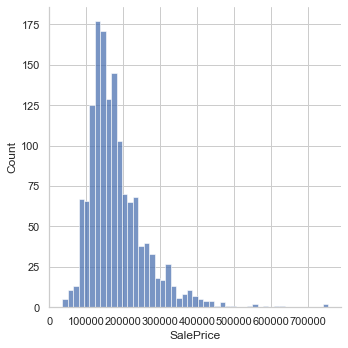

In [18]:
sns.displot(full_df['SalePrice'])

**SalePrice** distribution is asymmetrical and right skewed.

We may want to **apply log transformation** (or more complex transformation) to normalize the SalePrice shape. 

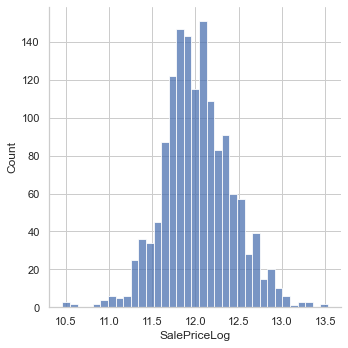

In [20]:
full_df['SalePriceLog'] = np.log(full_df['SalePrice'])

sns.displot(full_df['SalePriceLog'])

What about **SalePrice** central tendency?

In [23]:
full_df['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

The **50%** of houses had price **$163 000** and less. 25%, 50% and 75% may define a price tiers for us to simplify understand relation between feature values and **SalePrice** data. With this in mind, let's add a new column **SalePriceGroup** with four tiers:
* Cheap Groups:
    * **Less than 25%** houses (<= $129k)
    * Houses from **25% - 50%** range (>\$129k and <=\$163k)
* Expensive Groups:
    * Houses from **50%-75%** range (>\$163k and <=\$214k)
    * **75%** and more 

In [32]:
def impute_sale_price_group(sale_price):
    if sale_price <= 129975:
        return '25% and less'
    if sale_price > 129975 and sale_price <= 163000:
        return '25% - 50%'
    if sale_price > 163000 and sale_price < 214000:
        return '50% - 75%'
    if sale_price >= 214000:
        return '75% and more'

full_df['SalePriceGroup'] = full_df['SalePrice'].apply(impute_sale_price_group)

After brief review of the terget feature, let's dig deeper into rest of the features. We will all features similiarly to what we have done in the beginning: 

### 1.3.2 Room Number, Lot and Living Areas, Floor Areas

<img src="https://alphabet.ge/126/budget-double-or-twin-room.jpg" width="600px" />

**Living area** is a total area od internal part of the house where people spend most of the time being inside of the house.

Let's check **living area** distribution:

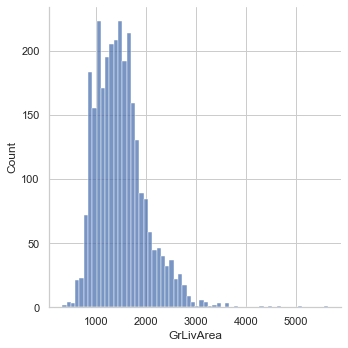

In [27]:
sns.displot(data=full_df['GrLivArea'])

**Living area** is right skewed. We may want to perform log transformation on it:

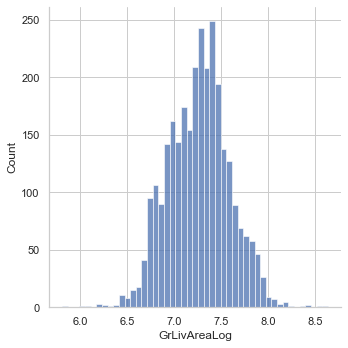

In [38]:
full_df['GrLivAreaLog'] = np.log(full_df['GrLivArea'])

sns.displot(data=full_df['GrLivAreaLog'])

**Living area** supposes to impact **SalePrice** and this is what we see on the next plot:

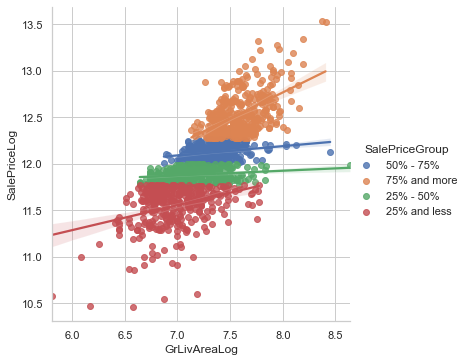

In [29]:
sns.lmplot(data=full_df, x='GrLivAreaLog', y='SalePriceLog', hue='SalePriceGroup')

We see a linear correlation and raising the SalePrice as the **living area** goes up/right. It's not surprising as living area is a common metric that affects home price.

There are two outliers. Their area more than 4,000 $ft^2$ but the sale prices are below than an average. Let's remove them from the dataset:

In [30]:
full_df.drop(
    full_df[(full_df['GrLivArea'] > 4000) & (full_df['SalePrice'] < 700000)].index,
    inplace=True
)

Next feature is **Total Room Number** (above ground). 

**Total Room Number** is also right skewed, so we will need to trasform it:

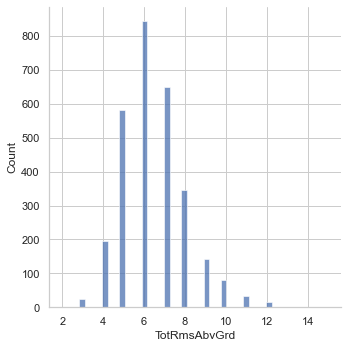

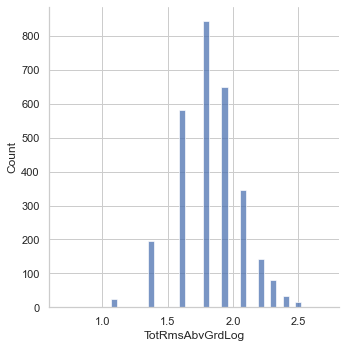

In [36]:
full_df['TotRmsAbvGrdLog'] = np.log(full_df['TotRmsAbvGrd'])

sns.displot(data=full_df['TotRmsAbvGrd'])
sns.displot(data=full_df['TotRmsAbvGrdLog'])

**Total Room Number** is connected to **Living Area** (correlation - **0.81**). The more living area, the more rooms normally present.

Room number seems to correlate with SalePrice as well (correlation - **0.54**).

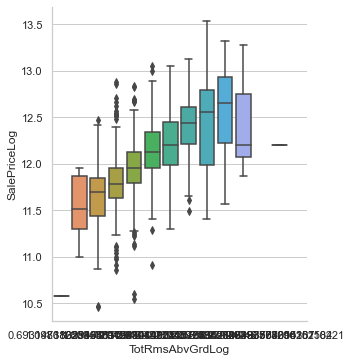

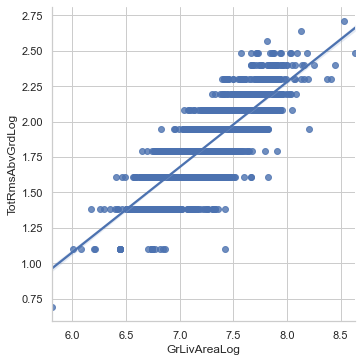

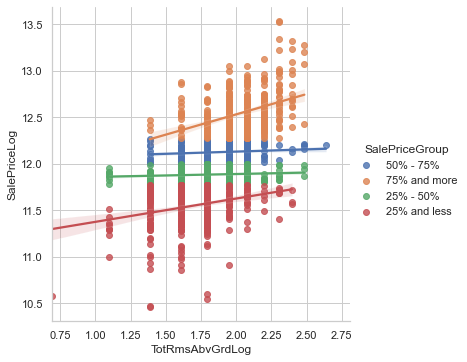

In [39]:
sns.catplot(data=full_df, x='TotRmsAbvGrdLog', y='SalePriceLog', kind='box')
sns.lmplot(data=full_df, x='GrLivAreaLog', y='TotRmsAbvGrdLog')
sns.lmplot(data=full_df, x='TotRmsAbvGrdLog', y='SalePriceLog', hue='SalePriceGroup')

To connect **Living Area** with **Room Number**, we can calculate an **average room area** (which happens to be skewed as well 😌): 

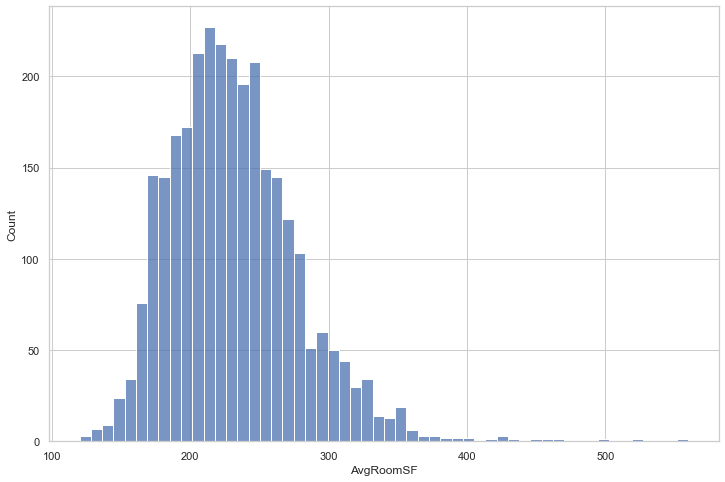

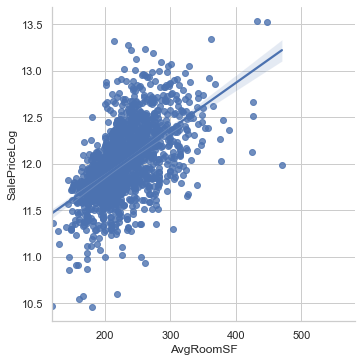

In [41]:
full_df['AvgRoomSF'] = full_df['GrLivArea'] / full_df['TotRmsAbvGrd']

sns.histplot(data=full_df, x='AvgRoomSF')
sns.lmplot(data=full_df, x='AvgRoomSF', y='SalePriceLog')

**Lot areas** is the next feature in the queue:

Most of the **lot areas** are **less than 50000 $ft^2$**. Probably, there might be some building standards that keep lot areas inside of the range.

That's why **Lot Area** just slightly correlates with **SalPrice** (correlation - **0.21**). It also one of the skewed features:

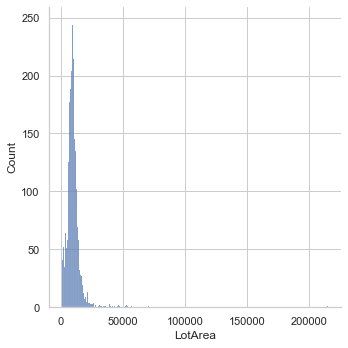

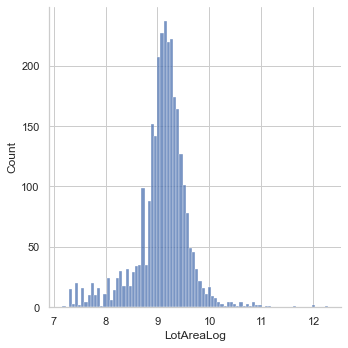

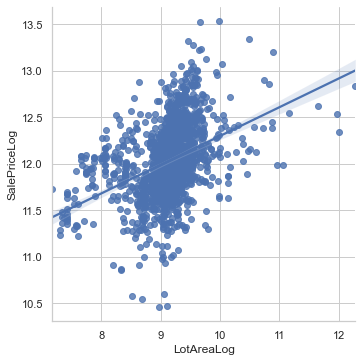

In [43]:
full_df['LotAreaLog'] = np.log(full_df['LotArea'])

sns.displot(data=full_df['LotArea'])
sns.displot(data=full_df['LotAreaLog'])
sns.lmplot(data=full_df, x='LotAreaLog', y='SalePriceLog')

Smaller part of the houses have more than **1 floor**:

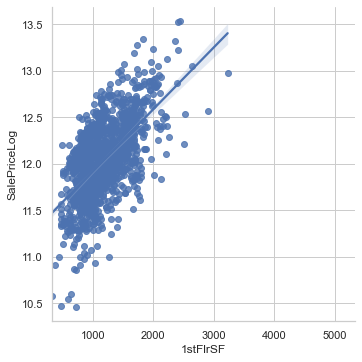

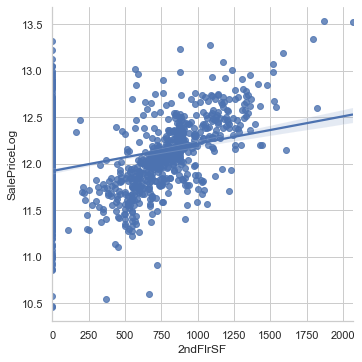

In [34]:
sns.lmplot(data=full_df, x='1stFlrSF', y='SalePriceLog')
sns.lmplot(data=full_df, x='2ndFlrSF', y='SalePriceLog')

**Floor areas** correlates with **SalePrice**. Namely, **SalePrice** seems to be linearly dependent on 1st floor area (and slightly on the 2nd floor area).

If we **summ 1st and 2nd floar areas**, we will get the **living area** feature. 

We nees to pay attension on the **finish quality** of living area as some house have living areas finished in **low quality**:

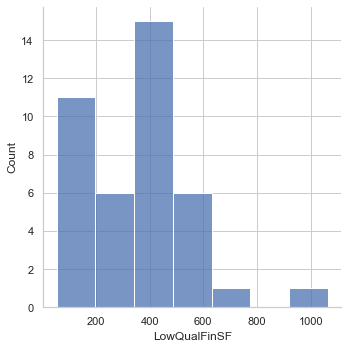

In [35]:
sns.displot(data=(full_df[full_df['LowQualFinSF'] > 0]['LowQualFinSF']))

The exact absolute area of low quality doesn't tell us much information. We may try to get how it related to the whole **living area**:

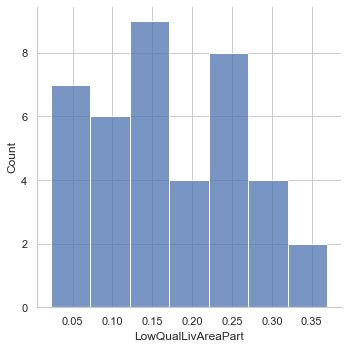

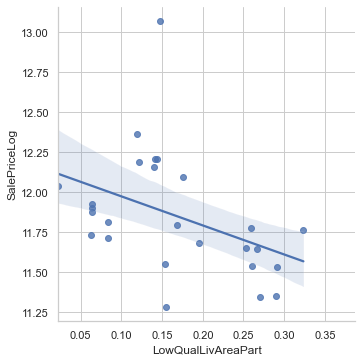

In [51]:
full_df['LowQualLivAreaPart'] = np.log1p(full_df['LowQualFinSF'] / full_df['GrLivArea'])

low_quality_finish_df = full_df[full_df['LowQualLivAreaPart'] > 0]

sns.displot(data=(low_quality_finish_df['LowQualLivAreaPart']))
sns.lmplot(data=low_quality_finish_df, x='LowQualLivAreaPart', y='SalePriceLog')

Just 40 houses had low quality finished area. It took up to 30% of living area.

### 1.3.4 House Types and Styles

<img src="https://st.hzcdn.com/simgs/pictures/exteriors/exterior-knight-construction-design-inc-img~333123010ec2c3ca_4-3527-1-e24d363.jpg" width="600px" />

Dataset contains three features related to **house building style**:
- house style - a house structure type with respect to levels and stories
- dwellig type - a house family capacity type
- dwelling subclass - a house structure type plus some additional iformation

**House Style** correlates with **sale prices**.

1Story, 1.5Fin and 2Story are the most popular. 2Story houses were especially popular among **75%+** house tier.

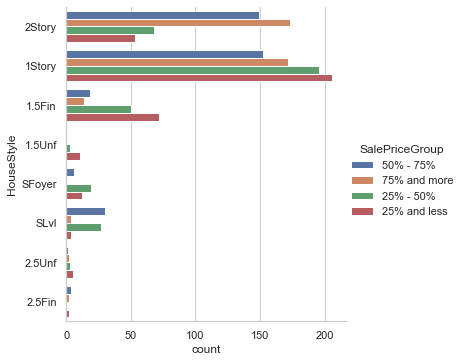

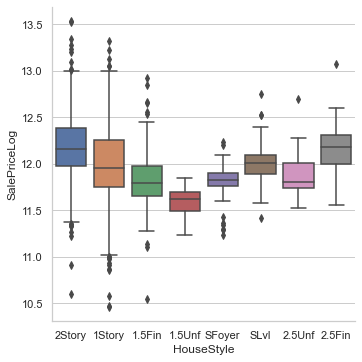

In [38]:
sns.catplot(data=full_df, y='HouseStyle', hue='SalePriceGroup', kind='count')
sns.catplot(data=full_df, x='HouseStyle', y='SalePriceLog', kind='box')

**House Style** contains information about house state (finished/unfinished) which affects **SalePrice**. Finished houses tend to be more expensive:

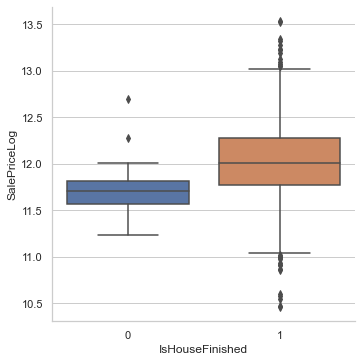

In [63]:
full_df['IsHouseFinished'] = (full_df['HouseStyle'].isin(['2Story', '1Story', '1.5Fin', 'SFoyer', 'SLvl', '2.5Fin'])) * 1

sns.catplot(data=full_df, x='IsHouseFinished', y='SalePriceLog', kind='box')

**Dwelling Type** correlates with **sale price**.

- House prices > 75% perc: 1Fam, TwnhsE
- House prices > 50% and < 75% perc: 1Fam, TwnhsE, TwnhsI
- House prices > 25% and < 50% perc: 1Fam, 2FamCon, TwnhsE, TwnhsI, Duplex
- House prices < 25% perc: 1Fam, 2fmCon, TwnhsE, TwnhsI, Duplex


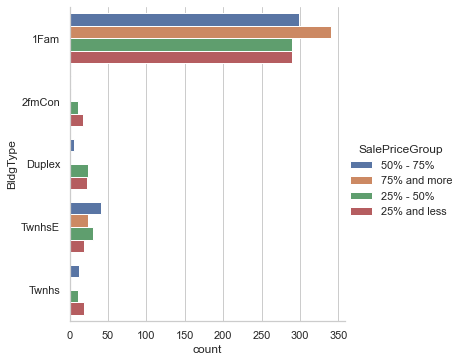

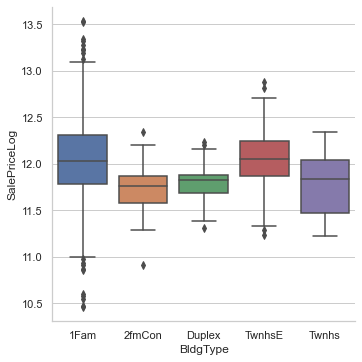

In [39]:
sns.catplot(data=full_df, y='BldgType', hue='SalePriceGroup', kind='count')
sns.catplot(data=full_df, x='BldgType', y='SalePriceLog', kind='box')

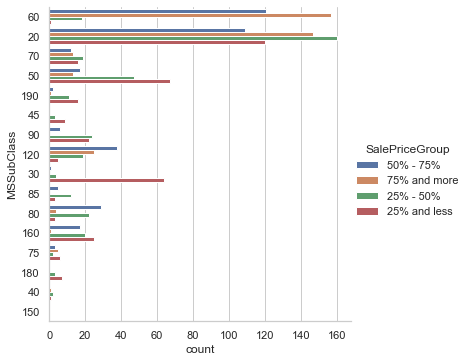

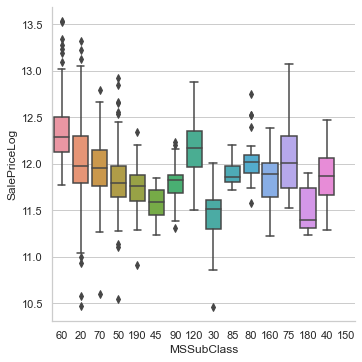

In [40]:
# MSSubClass type of dwelling is a helpful differentiator of the sale price
## House prices > 75% perc: 20, 60, 70, 75, 80, 120 (1 and 2 story of 1946 and newer)
## House prices > 50% and < 75% perc: 20, 60, 80, 120, 160 (diff styles of newer types)
## House prices > 25% and < 50% perc: 20, 30, 40, 45, 50, 60, 70, 80, 85, 90, 120, 160, 190
## House prices < 25% perc: 20, 30, 45, 50, 70, 75, 90, 120, 160, 190 (Older and unfinished styles)

sns.catplot(data=full_df, y='MSSubClass', hue='SalePriceGroup', kind='count')
sns.catplot(data=full_df, x='MSSubClass', y='SalePriceLog', kind='box')

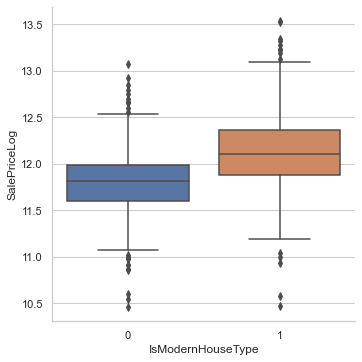

In [64]:
full_df['IsModernHouseType'] = full_df['MSSubClass'].map({
    '20': 1, 
    '30': 0, 
    '40': 0, 
    '45': 0, 
    '50': 0, 
    '60': 1, 
    '70': 0, 
    '75': 0,
    '80': 0, 
    '85': 0, 
    '90': 0, 
    '120': 1, 
    '150': 0, 
    '160': 1, 
    '180': 0, 
    '190': 0,
})

sns.catplot(data=full_df, x='IsModernHouseType', y='SalePriceLog', kind='box')

<img src="https://upload.wikimedia.org/wikipedia/en/8/88/Traditional_Side_Split_Level_Home.jpg" width="600px" />

**Split or multilevel houses** - is a style of house in which the floor levels are staggered. There are typically two short sets of stairs, one running upward to a bedroom level, and one going downward toward a basement area.

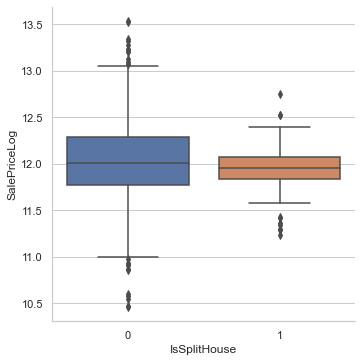

In [251]:
full_df['IsSplitHouse'] = full_df['MSSubClass'].map({
    '20': 0, 
    '30': 0, 
    '40': 0, 
    '45': 0, 
    '50': 0, 
    '60': 0, 
    '70': 0, 
    '75': 0,
    '80': 1, 
    '85': 1, 
    '90': 0, 
    '120': 0, 
    '150': 0, 
    '160': 0, 
    '180': 1, 
    '190': 0,
})


sns.catplot(data=full_df, x='IsSplitHouse', y='SalePriceLog', kind='box')

<img src="https://i.pinimg.com/originals/83/e3/55/83e3550d85f3032b7c7905a1e8740d44.jpg" width="600px" />

A **Planned Unit Development (PUD)** is a community of homes that could look like single family residences. PUDs often have amenities beyond the scope of most condos, like private tennis courts and outdoor playgrounds that are maintained by HOA fees and only open to homeowners. 

More Info: https://www.redfin.com/guides/what-is-a-planned-unit-development

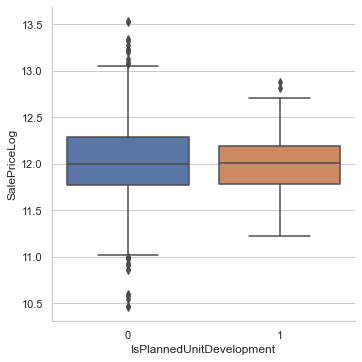

In [243]:
full_df['IsPlannedUnitDevelopment'] = full_df['MSSubClass'].map({
    '20': 0, 
    '30': 0, 
    '40': 0, 
    '45': 0, 
    '50': 0, 
    '60': 0, 
    '70': 0, 
    '75': 0,
    '80': 0, 
    '85': 0, 
    '90': 0, 
    '120': 1, 
    '150': 1, 
    '160': 1, 
    '180': 1, 
    '190': 0,
})

sns.catplot(data=full_df, x='IsPlannedUnitDevelopment', y='SalePriceLog', kind='box')

### LotShape and LotConfig

<img src="https://www.thespruce.com/thmb/3SxFiTuF_AkddfCepVSTOVUJSIU=/1989x1492/smart/filters:no_upscale()/fotog-56a2e3333df78cf7727af480.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='LotConfig'>

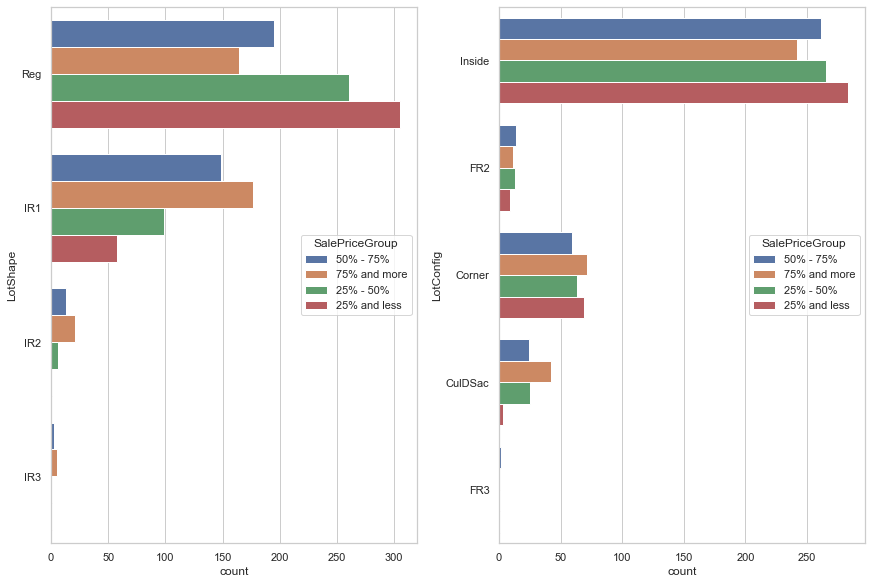

In [38]:
# Houses with SalePrice > 75% percentile dominate among houses with irregular shape.
# Most of the Houses with SalePrice < 25% have a regular shape tho.

# Lot configuration: 
## Houses with SalePrice > 75% percentile have Corner, Inside, FR2, CulDSac types
## Houses with SalePrice < 25% have mostly inside types and also Corner and FR2 types
# More info: https://www.thetruthaboutrealty.com/real-estate-lot-types/

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='LotShape', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='LotConfig', hue='SalePriceGroup', ax=ax[1])

<img src="https://i.pinimg.com/originals/73/42/79/7342799b300e2a8a6493426909d6beaa.jpg" />

**Frontage** is width of a lot, measured at the front part of the lot. **Footage** correlates with **LotArea** (the bigger lot area, the bigger frontage). **Frontage** is also a skewed feature:

More Info: https://www.gimme-shelter.com/frontage-50043/

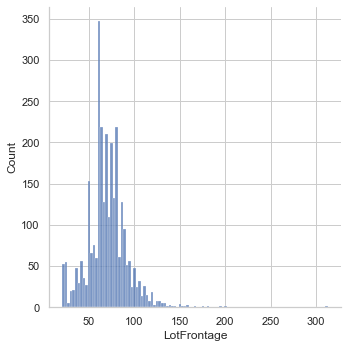

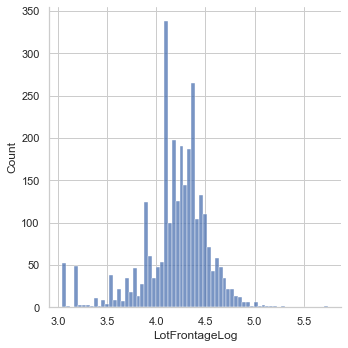

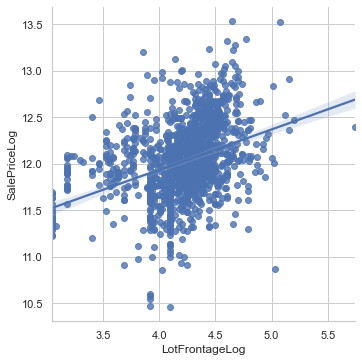

In [39]:
full_df['LotFrontageLog'] = np.log(full_df['LotFrontage'])

sns.displot(full_df['LotFrontage'])
sns.displot(full_df['LotFrontageLog'])
sns.lmplot(data=full_df, x='LotFrontageLog', y='SalePriceLog')

**SalePrice** seems to be linearly dependent on the **Frontage**. 
Wider houses are more valuable than "deep" one. A wider lot will allow for a larger house, and often allow for more space between homes or buildings. Wide lots also allow decent parking on front streets or duplexes to be built on the lot as long as the zoning permits it

### LandContour and LandSlope

<img src="https://res.cloudinary.com/trends-publishing/image/upload/ar_1.8,c_thumb,dpr_2.0,g_center,w_800/f_auto,q_auto:best/0152817.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='LandSlope'>

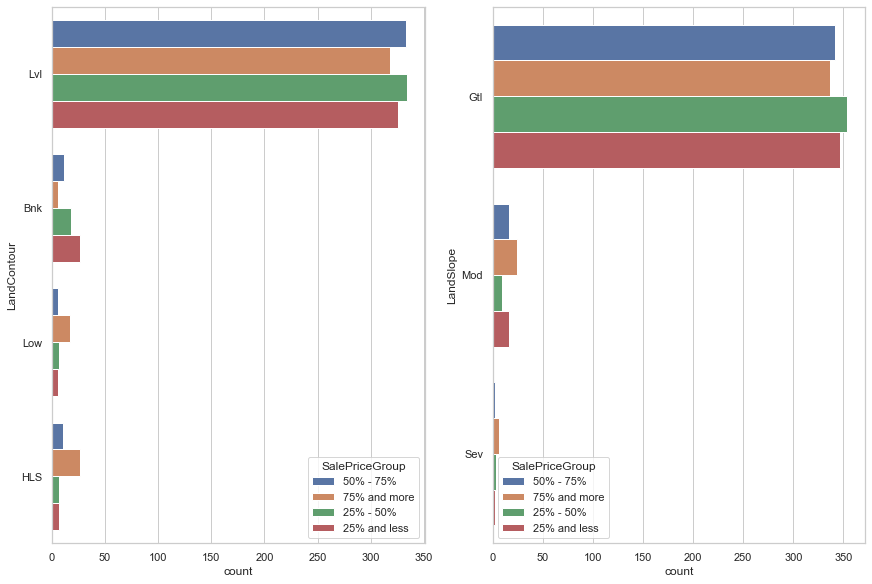

In [40]:
# Land Contour
## Low and hillside flatness as well as moderate and severe slopes dominate among house with SalePrice > 75% percentile. Probably, these houses have some kind of landscape design work done

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='LandContour', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='LandSlope', hue='SalePriceGroup', ax=ax[1])

### Foundation and Basement

<img src="https://i.pinimg.com/736x/d2/41/da/d241da589a358ca41be75dbacb968815.jpg" />

**Basement** is part of house that located below the ground. 

When it's finished, basement can be pretty helpfull. There may be located a bathroom or cozy corner for the rest 

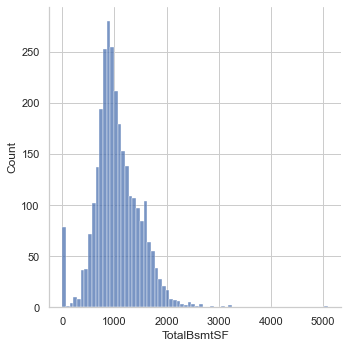

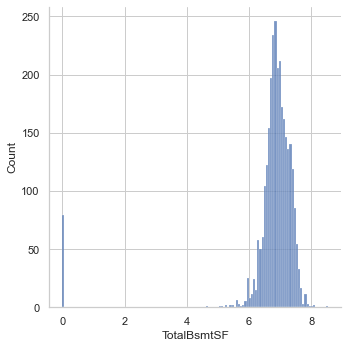

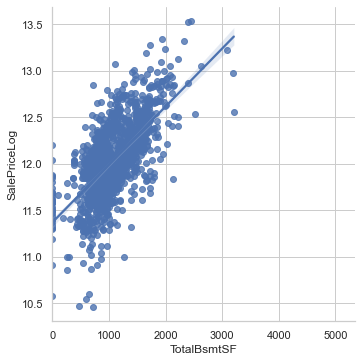

In [41]:
sns.displot(full_df['TotalBsmtSF'])
sns.displot(np.log1p(full_df['TotalBsmtSF']))
sns.lmplot(data=full_df, x='TotalBsmtSF', y='SalePriceLog')

While basement area is not that attractive as above ground one, it still strongly correlates with SalePrice.

Basement Quality and Condition should help us to calibrate a part of SalePrice that the basement brings:

<AxesSubplot:xlabel='count', ylabel='BsmtCond'>

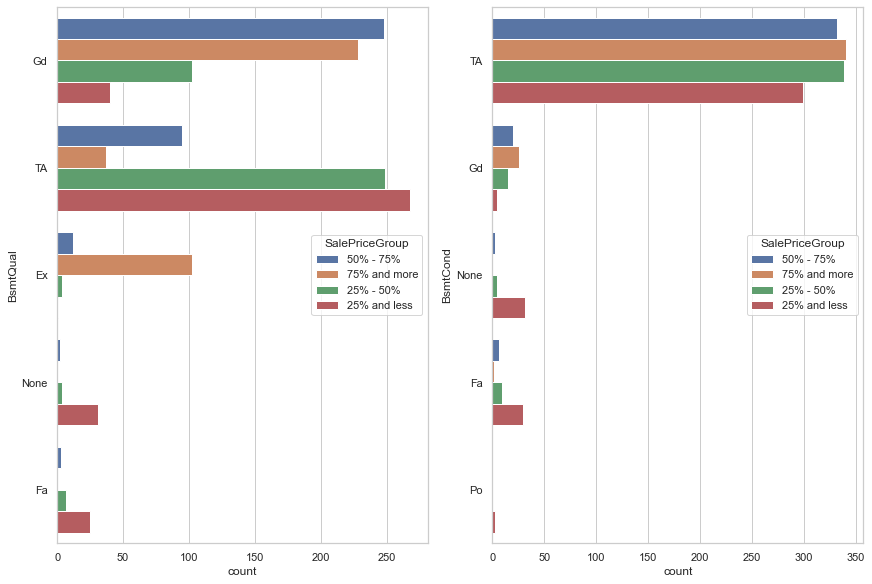

In [42]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='BsmtQual', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='BsmtCond', hue='SalePriceGroup', ax=ax[1])

Basement Quality and Condition show a typical situation: >50% tier has basements with above average conditions and built from quality materials.


Another metric is whenever basement is finished or not:

<AxesSubplot:xlabel='count', ylabel='BsmtFinType2'>

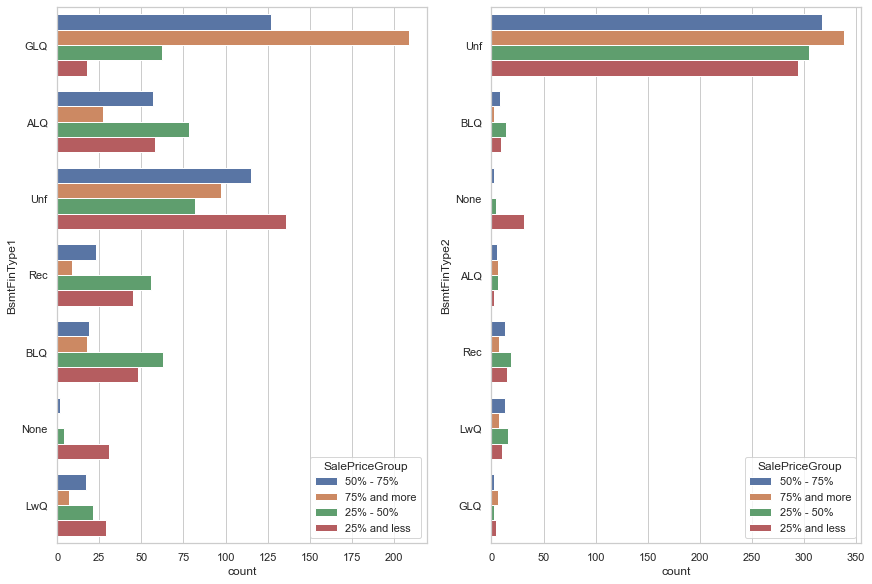

In [43]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="BsmtFinType1", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="BsmtFinType2", hue="SalePriceGroup", ax=ax[1])

Basement may be finished in different ways. It can be turned into recreation, living quarters or bathrooms:

More Info: https://www.cidbasements.com/qualifies-finished-basement#:~:text=A%20basement%20is%20finished%20when,level%20ceilings%2C%20and%20finished%20walls.

Big part of houses don't have bathrooms in the basement. Half bathrooms in the basement is rare and some houses actully have full bathrooms in the basement.

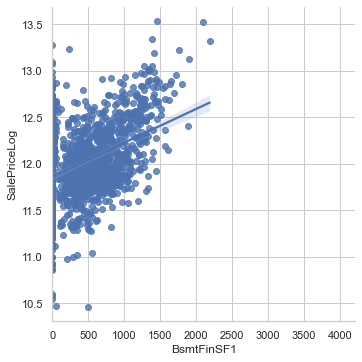

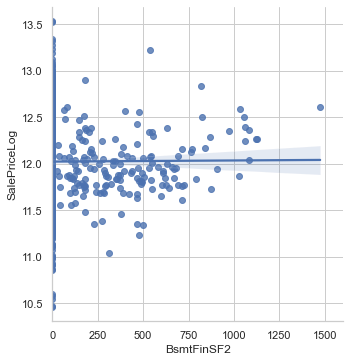

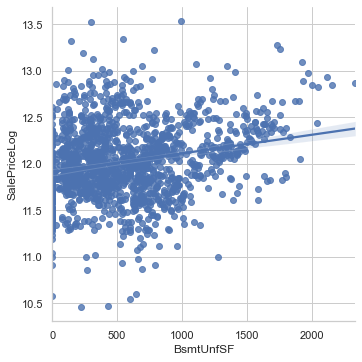

In [44]:
sns.lmplot(data=full_df, x='BsmtFinSF1', y='SalePriceLog')
sns.lmplot(data=full_df, x='BsmtFinSF2', y='SalePriceLog')
sns.lmplot(data=full_df, x='BsmtUnfSF',  y='SalePriceLog')

Essentially, **TotalBsmtSF** is a sum of **BsmtFinSF1**, **BsmtFinSF2** and **BsmtUnfSF**. 

All missing information in these fields we can impute with zeroes. Most likely, missing information in basement areas mean that a lot doesn't have basement.

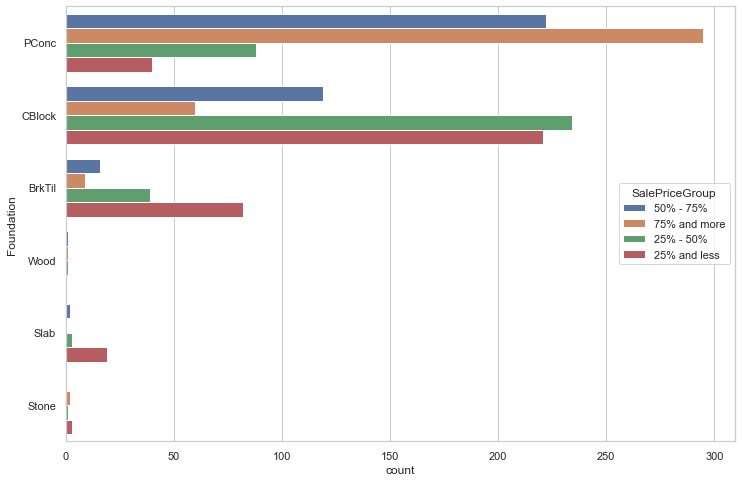

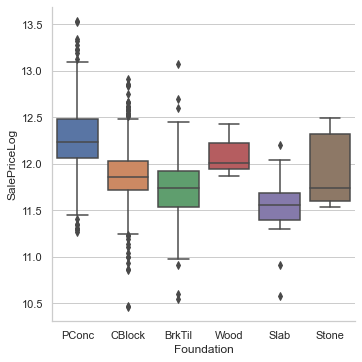

In [175]:
sns.countplot(data=full_df, y='Foundation', hue='SalePriceGroup')
sns.catplot(data=full_df, x='Foundation', y='SalePriceLog', kind='box')

Poured Contrete foundation is popular in >50% tier. It seems to be a modern way to found houses. The rest of types may be just old fashion.

### Basement Exposure

<img src="https://i.pinimg.com/originals/28/4d/e6/284de644ff254abcda378ee0d2c5c04a.jpg" width="600px" />

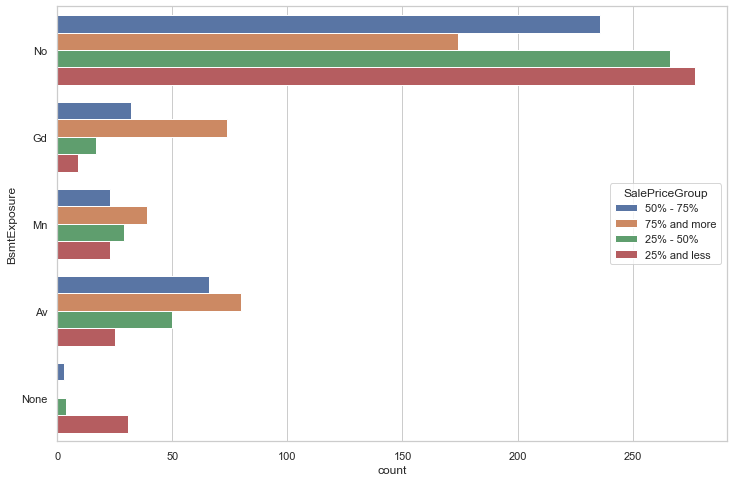

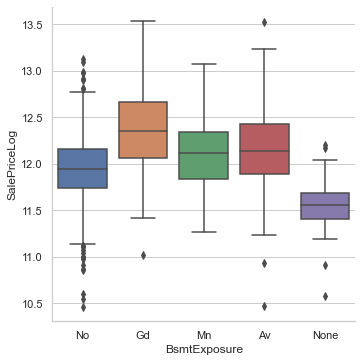

In [176]:
sns.countplot(data=full_df, y='BsmtExposure', hue='SalePriceGroup')
sns.catplot(data=full_df, x='BsmtExposure', y='SalePriceLog', kind='box')

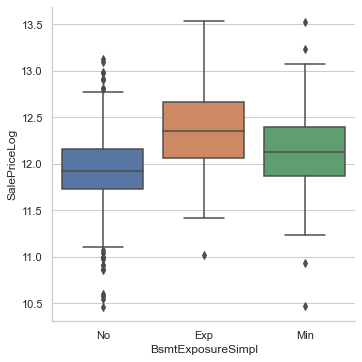

In [181]:
full_df['BsmtExposureSimpl'] = full_df['BsmtExposure'].map({
    'None': 'No',
    'No': 'No',
    'Mn': 'Min',
    'Av': 'Min',
    'Gd': 'Exp'
})

sns.catplot(data=full_df, x='BsmtExposureSimpl', y='SalePriceLog', kind='box')

### House Overall Condition and Material Quality

<AxesSubplot:xlabel='count', ylabel='OverallQual'>

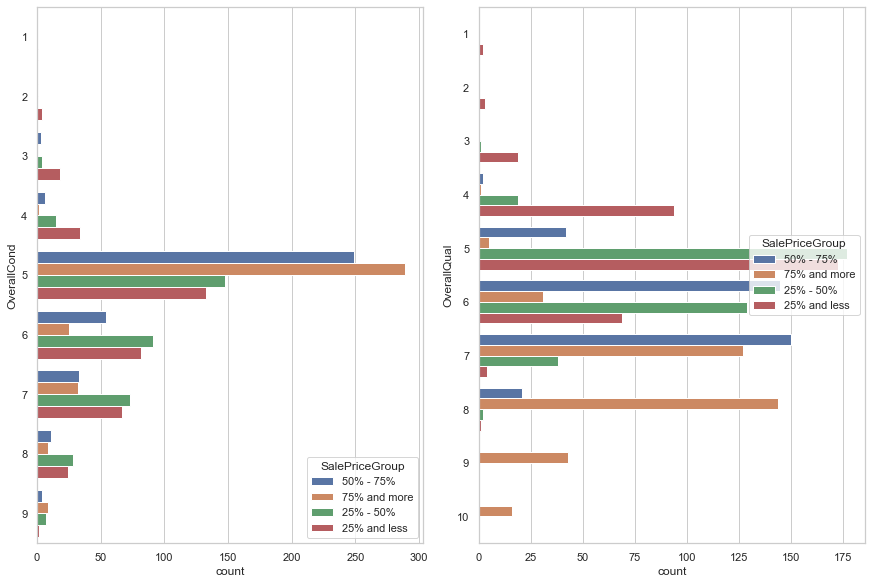

In [46]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='OverallCond', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='OverallQual', hue='SalePriceGroup', ax=ax[1])

**Overall Condition** and **Overall Material Quality** strongly correlates with SalePrices.

Houses with SalePrice > 50% percentile have **average and higher overall** condition. Lots with SalePrice < 50% tier have a higher percentage among **below average condition** houses, but generally they are included to all condition groups.

**Overall Material Quality** seems to differentiate expensive houses from cheap ones. Lots with SalePrice < 50% tier dominates in average and below quality groups. In above average quality groups, there are a bigger percentage of houses with SalePrice > 50% tier (particularly, lots with SalePrice > 75% tier prevail in "very good" and above quality groups).

Let's try to create **Overall House QC** metric:

<AxesSubplot:xlabel='count', ylabel='OverallHouseQC'>

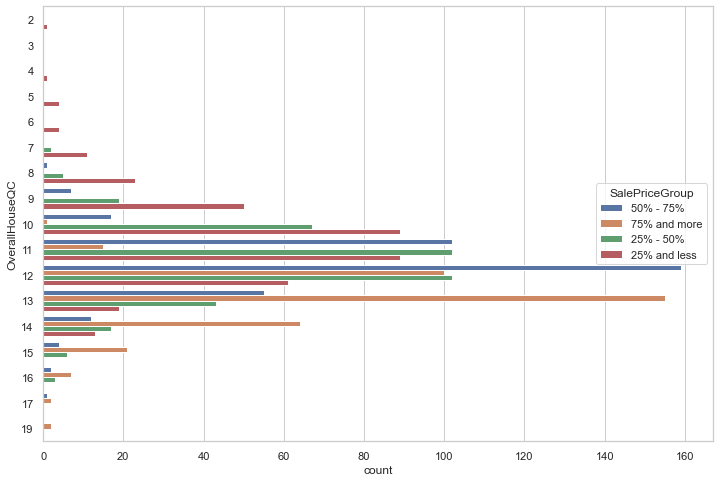

In [47]:
full_df['OverallHouseQC'] = full_df['OverallCond'] + full_df['OverallQual']

sns.countplot(data=full_df, y='OverallHouseQC', hue='SalePriceGroup')

Also, let's try to bin this metrics as we get a lot of categories:

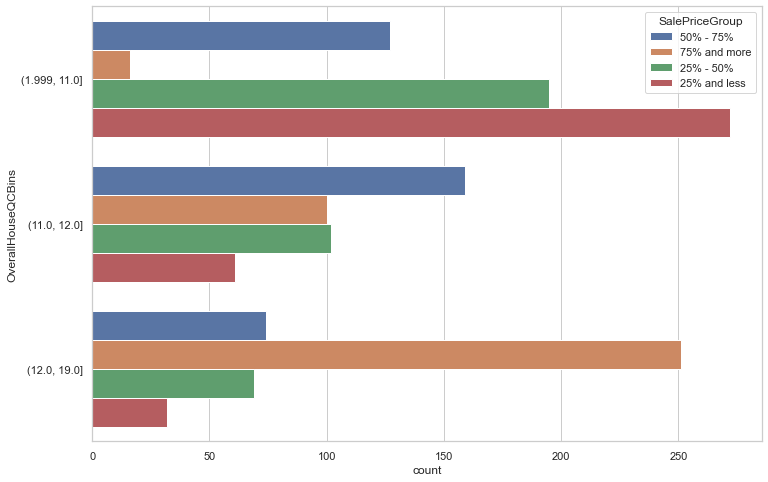

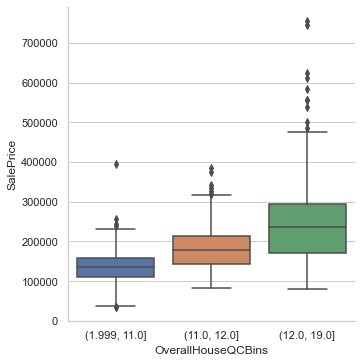

In [48]:
full_df['OverallHouseQCBins'] = pd.qcut(full_df['OverallHouseQC'], q=3)

sns.countplot(data=full_df, y='OverallHouseQCBins', hue='SalePriceGroup')
sns.catplot(data=full_df, x='OverallHouseQCBins', y='SalePrice', kind='box')

Three bins diffentiate houses well from what we can see on the boxplot.

<AxesSubplot:xlabel='count', ylabel='Functional'>

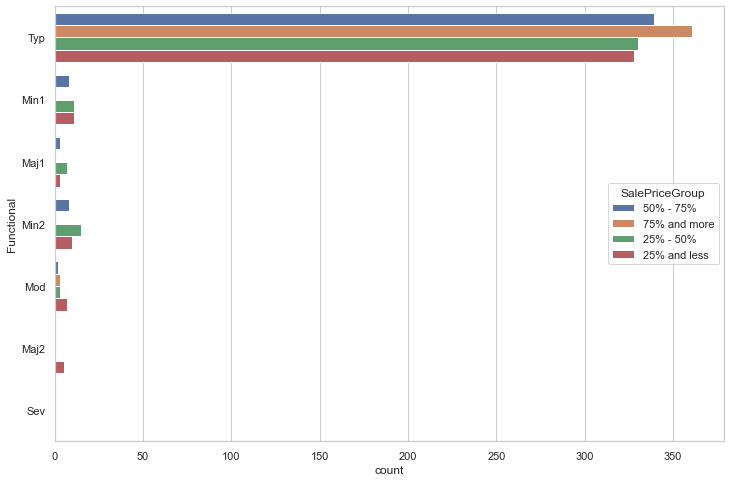

In [49]:
sns.countplot(data=full_df, y='Functional', hue='SalePriceGroup')

Samples with a functionality other than "Typical" **losses sale prices drastically**. 

Other types of functionality are much less frequent. So we may benefit from turing **Functional** feature into flag or reduce number of groups:

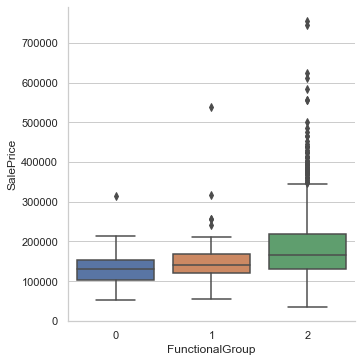

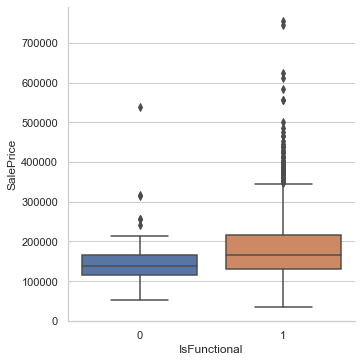

In [50]:
full_df['IsFunctional'] = (full_df['Functional'] == 'Typ') * 1
full_df['FunctionalGroup'] = full_df['Functional'].map({
    'Typ': 2,
    'Min1': 1,
    'Min2': 1,
    'Mod': 1,
    'Maj1': 0,
    'Maj2': 0,
    'Sev': 0,
    'Sav': 0,
})

sns.catplot(data=full_df, x='FunctionalGroup', y='SalePrice', kind='box')
sns.catplot(data=full_df, x='IsFunctional', y='SalePrice', kind='box')

### Year Built and Renovate

Let's see how old houses and when they were remodeled:

In [51]:
full_df[['YearBuilt', 'YearRemodAdd']].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
YearBuilt,2917.0,1971.287967,30.286991,1872.0,1953.0,1973.0,2001.0,2010.0
YearRemodAdd,2917.0,1984.248200,20.892257,1950.0,1965.0,1993.0,2004.0,2010.0


The dataset covers houses that were build between 1872 and 2010 (138 years). It's 10-years old as of now (2020) which is okay for training purpose, but will be not that useful for production.

How did **YearBuild** affect **SalePrice**?

<AxesSubplot:xlabel='YearBuilt', ylabel='Count'>

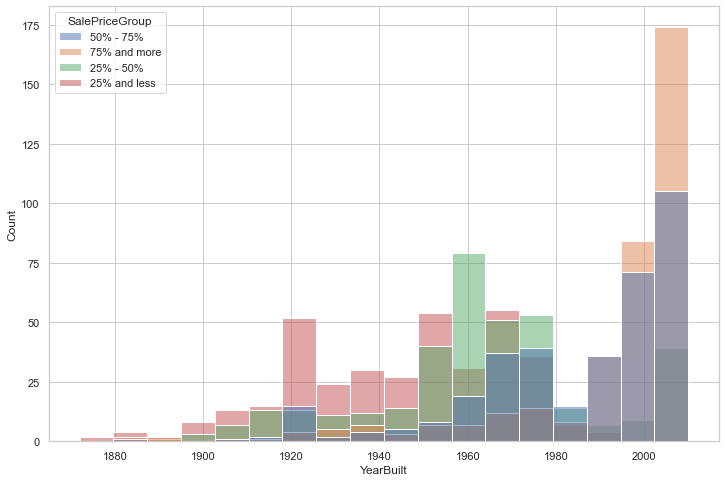

In [52]:
sns.histplot(data=full_df, x='YearBuilt', hue='SalePriceGroup')

Most of the cheap houses (<50% tier) were built in between of 1872 and 1970
Expensive houses (>50% tier) had been built after that time.

We can assume that people prefer to buy newly build houses. They may have better condition and better building techniques involved. 

Are there any houses that were sold exactly in a year they had been built/remodeled?

In [158]:
full_df[full_df['YearBuilt'] == full_df['YrSold'].astype(int)][['YearBuilt', 'YrSold']].count()

YearBuilt    114
YrSold       114
dtype: int64

In [157]:
full_df[full_df['YearRemodAdd'] == full_df['YrSold'].astype(int)][['YearBuilt', 'YrSold']].count()

YearBuilt    237
YrSold       237
dtype: int64

todo: rewrite as I was wrong about this one. There are houses like that

Surprisingly, there are no such houses. How did remodeling impact the sale price?

<AxesSubplot:xlabel='YearRemodAdd', ylabel='Count'>

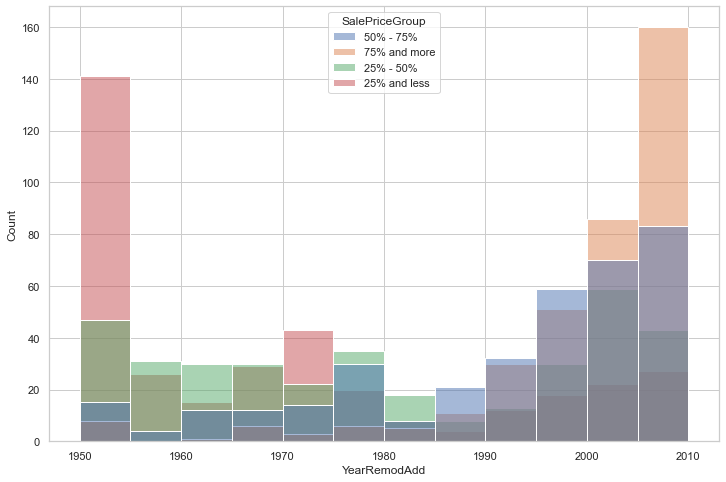

In [55]:
sns.histplot(data=full_df, x='YearRemodAdd', hue='SalePriceGroup')

Recently remodeled houses had **higher price**. Remodeling improves condition of the house, so there is no surprises.

Let's check how time that passed since remodeling impacts sale price:

<AxesSubplot:xlabel='YearsSinceBuilt', ylabel='Count'>

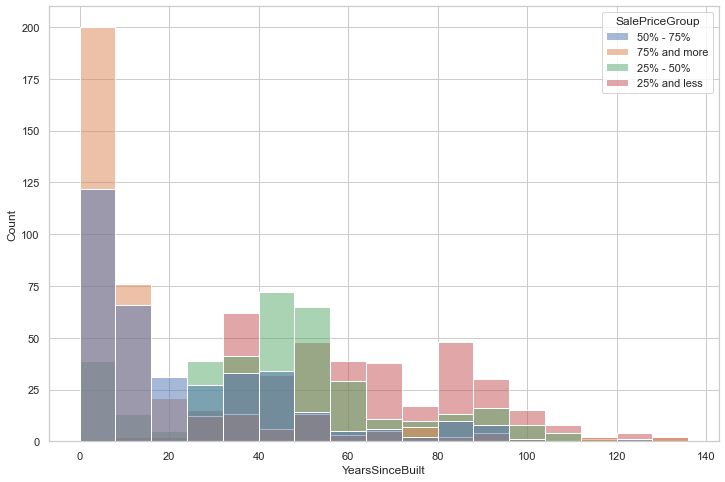

In [56]:
full_df['YearsSinceBuilt'] = full_df['YrSold'].astype(int) - full_df['YearBuilt'].astype(int)
full_df['YearsSinceRemod'] = full_df['YrSold'].astype(int) - full_df['YearRemodAdd'].astype(int)
full_df['Remodeled'] = (full_df['YearRemodAdd'] != full_df['YearBuilt']) * 1

sns.histplot(data=full_df, x='YearsSinceBuilt', hue='SalePriceGroup')

<AxesSubplot:xlabel='YearsSinceRemod', ylabel='Count'>

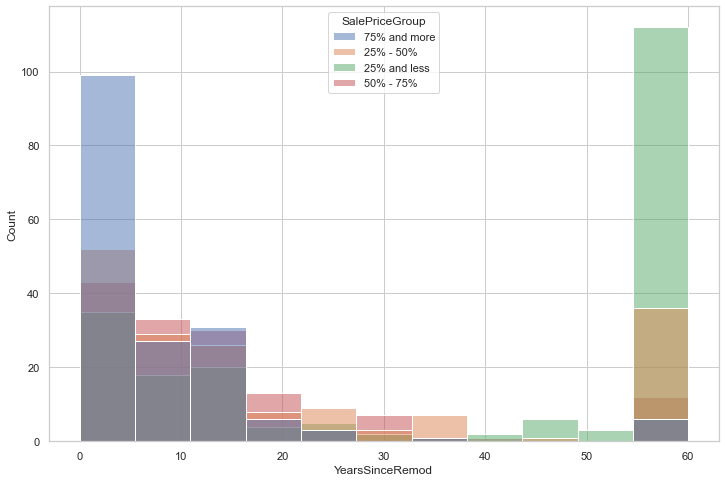

In [57]:
sns.histplot(data=full_df[full_df['Remodeled'] == 1], x='YearsSinceRemod', hue='SalePriceGroup')

As we can see, the longer time has passed since built/remodeling the cheaper house would be. Namely, most of expensive houses had been remodeled **25 years ago or less** before they were sold. Also, the most expensive houses were built **20 years ago or less**.

Needs to say that the exact year of building or remodeling is not important for us and may bring a lot of noice to the model. We would like to **bin age metrics** instead using **10-20** year bins (pretty much like on the plots).

<AxesSubplot:xlabel='YearBuiltBin', ylabel='Count'>

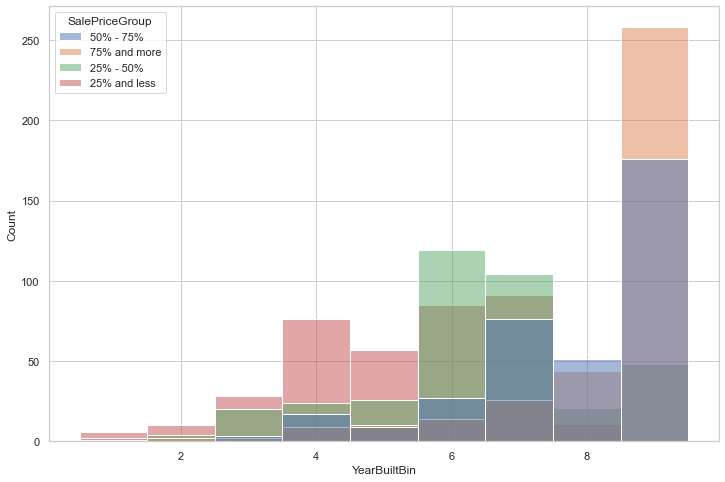

In [164]:
year_built_bins = np.linspace(1871, 2010, 10) # 10 bins
full_df['YearBuiltBin'] = pd.cut(full_df['YearBuilt'], bins=year_built_bins, labels=range(1, 10)) 

sns.histplot(data=full_df, x='YearBuiltBin', hue='SalePriceGroup')

### House Access

<img src="https://i.dailymail.co.uk/i/pix/2014/07/31/article-2712017-2028C76F00000578-277_634x458.jpg" />

<AxesSubplot:xlabel='count', ylabel='Street'>

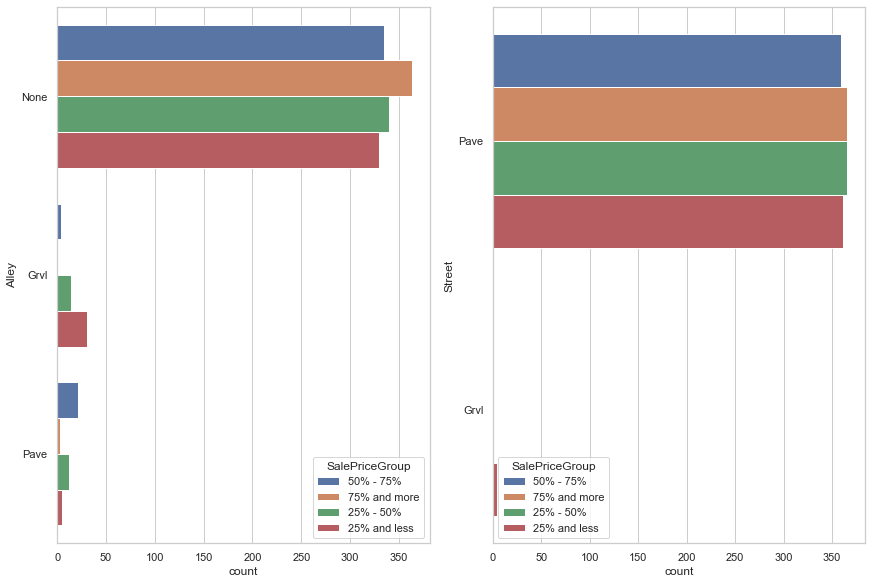

In [58]:
# Most of houses that have SalePrice < 50% connected with gravel alleys or gravel streets.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='Alley', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='Street', hue='SalePriceGroup', ax=ax[1])

Most of the houses have paved drive:

<AxesSubplot:xlabel='count', ylabel='PavedDrive'>

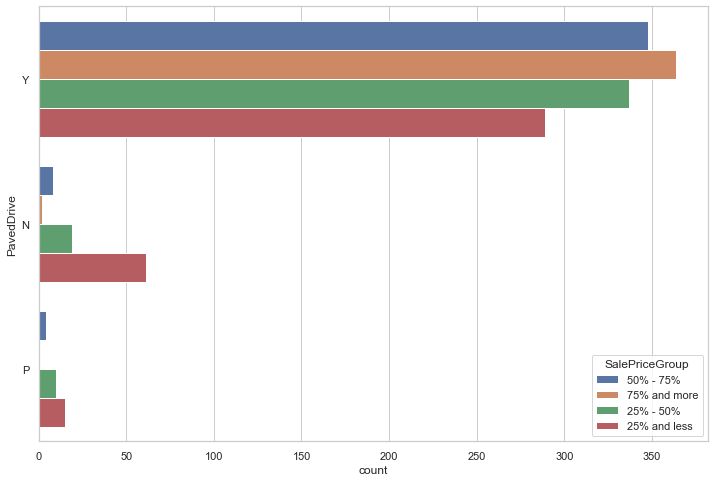

In [59]:
sns.countplot(data=full_df, y='PavedDrive', hue='SalePriceGroup')

We can reduce amount of noice by convering **PavedDrive** feature into a flag:

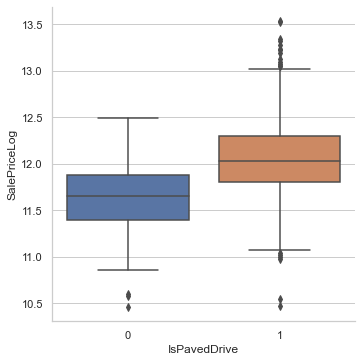

In [60]:
full_df['IsPavedDrive'] = (full_df['PavedDrive'] == 'Y') * 1

sns.catplot(data=full_df, x='IsPavedDrive', y='SalePriceLog', kind='box')

### House Location: Neighborhood, Zoning and Additional Conditions

<img src="https://www.lendinghome.com/blog/wp-content/uploads/2018/11/houses-in-the-same-neighborhood.jpg" width="600px" />

**Neighborhood** and **MSZoning** do correlate with **SalePrice**.

**Neighborhood** Insights

- Neighborhoods with house price below the mean: IDOTRR, Swisu, DrDale, NPkVill, MeadowV, Sawyer, OldTown, Edwards, NAmes
- Neighborhoods with house price above the mean: NoRidge, Mitchel, Crawfor, SawyerW, Timber, Somerst, CollgeCr, Gilbert, NWAmes
- Neighborhoods with house price above 75% perct: NridgHt, CollgeCr, Crawfor, Timber, StoreBr

**Zoning** Insights:
- Zoning with house price above the mean: RL, FV
- Zoning with house price below the mean: RM, C, RH

More Information: https://www.investopedia.com/terms/z/zoning.asp#:~:text=Zoning%20allows%20lo

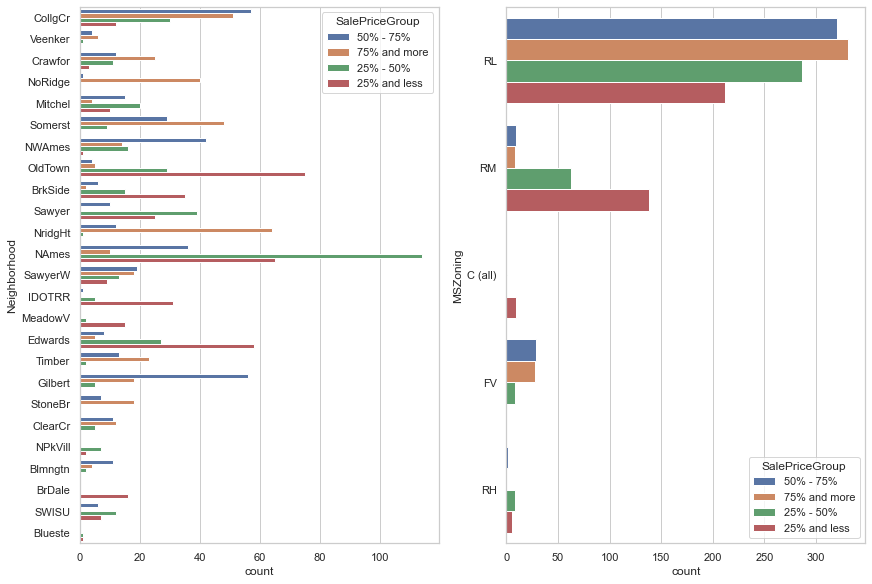

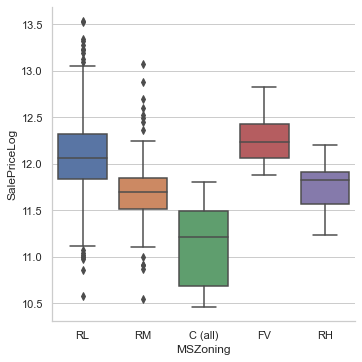

In [258]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='Neighborhood', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=fullDf, y='MSZoning', hue='SalePriceGroup', ax=ax[1])

sns.catplot(data=full_df, x='MSZoning', y='SalePriceLog', kind='box')

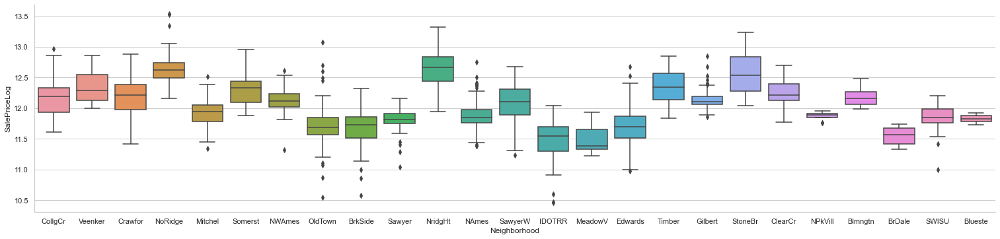

In [262]:
g = sns.catplot(data=full_df, x='Neighborhood', y='SalePriceLog', kind='box')
g.fig.set_figwidth(25)

Based on list of neighborhoods where expensive houses tended to be sold, we can call them **"elite" neighborhoods** and create a flag to mark them:

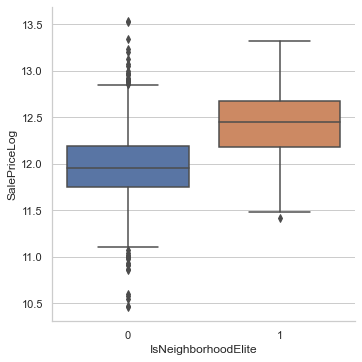

In [62]:
full_df['IsNeighborhoodElite'] = (full_df['Neighborhood'].isin(['NridgHt', 'CollgeCr', 'Crawfor', 'StoreBr', 'Timber'])) * 1

sns.catplot(data=full_df, x='IsNeighborhoodElite', y='SalePriceLog', kind='box')

Thare are 25 neighborhoods in our list. This is a lot of options which may bring some noice to models.

We can think about grouping neighborhoods into smaller number of groups based on the average house price:

In [266]:
full_df['SalePrice'].groupby(full_df['Neighborhood']).median().sort_values()

Neighborhood
MeadowV     88000.0
IDOTRR     103000.0
BrDale     106000.0
OldTown    119000.0
Edwards    119500.0
BrkSide    124300.0
Sawyer     135000.0
Blueste    137500.0
SWISU      139500.0
NAmes      140000.0
NPkVill    146000.0
Mitchel    153500.0
SawyerW    179900.0
Gilbert    181000.0
NWAmes     182900.0
Blmngtn    191000.0
CollgCr    197200.0
ClearCr    200250.0
Crawfor    200624.0
Veenker    218000.0
Somerst    225500.0
Timber     228475.0
StoneBr    278000.0
NoRidge    301500.0
NridgHt    315000.0
Name: SalePrice, dtype: float64

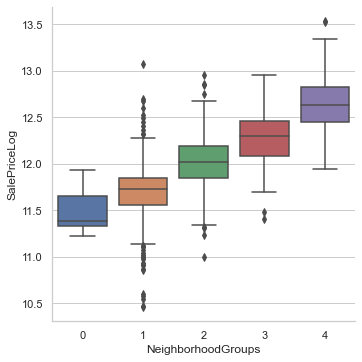

In [267]:
full_df['NeighborhoodGroups'] = full_df['Neighborhood'].map({
    'MeadowV': 0,
    'IDOTRR': 1,
    'BrDale': 1,
    'OldTown': 1,
    'Edwards': 1,
    'BrkSide': 1,
    'Sawyer': 1,
    'Blueste': 1,
    'SWISU': 2,
    'NAmes': 2,
    'NPkVill': 2,
    'Mitchel': 2,
    'SawyerW': 2,
    'Gilbert': 2,  
    'NWAmes': 2,   
    'Blmngtn': 2,  
    'CollgCr': 2,  
    'ClearCr': 3,  
    'Crawfor': 3,  
    'Veenker': 3,  
    'Somerst': 3,  
    'Timber': 3,   
    'StoneBr': 4, 
    'NoRidge': 4, 
    'NridgHt': 4,
})

sns.catplot(data=full_df, x='NeighborhoodGroups', y='SalePriceLog', kind='box')

SalePrice is beatifully going up as we expect!

**Condition1** and **Condition2** features represent additional location advantages or disadvantages:
- a lot might be adjacent or near off site park or forest (house sale price goes up)
- a lot might be adjacent or near noisy street or railroad (house sale price goes down)

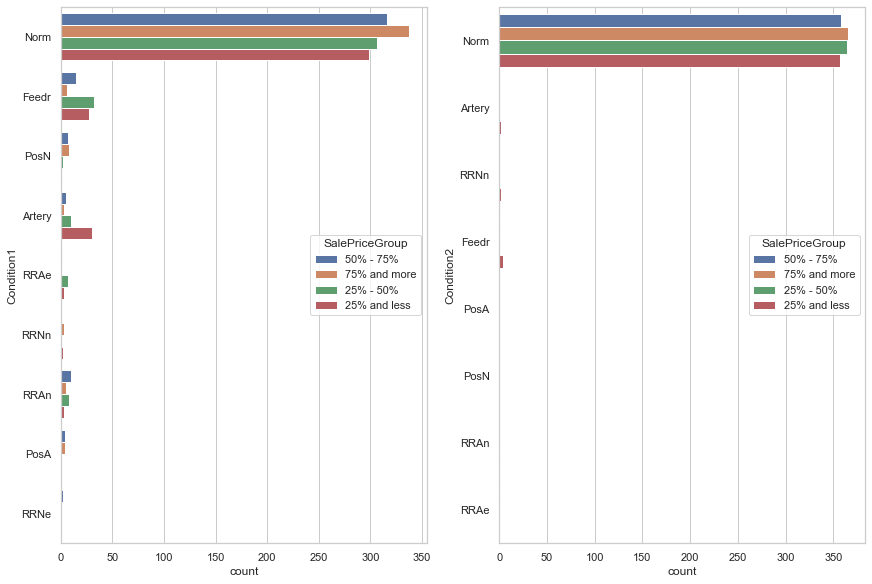

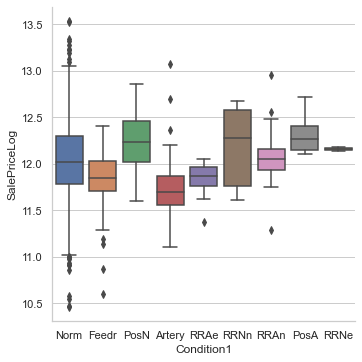

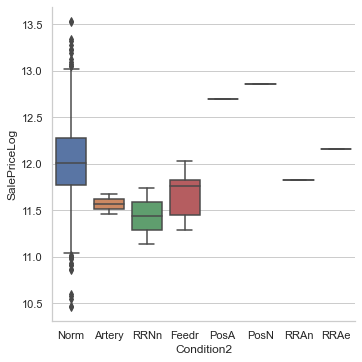

In [63]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='Condition1', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='Condition2', hue='SalePriceGroup', ax=ax[1])

sns.catplot(data=full_df, x='Condition1', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='Condition2', y='SalePriceLog', kind='box')

Since **Condition1** and **Condition2** describes the same set of conditions, we can merge them into a few flags:
- Is Adjacent to Arterial Street?
- Is Adjacent to Feeder Street?
- Is Adjacent to Railroad?
- Is Near to Feeder Street?
- Is Adjacent to Offsite Feature?
- Is Near to Offsite Feature?

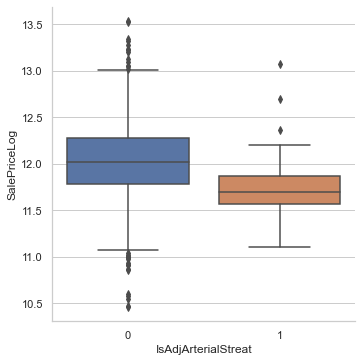

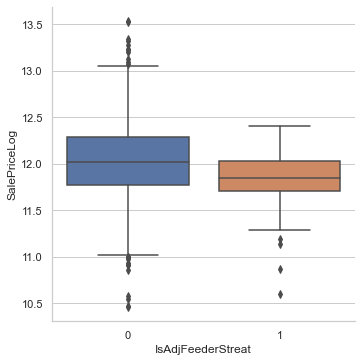

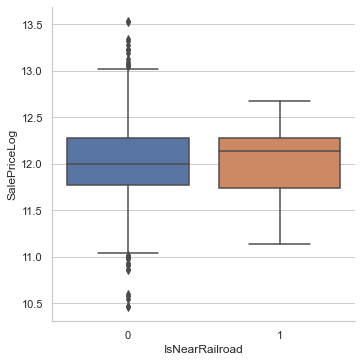

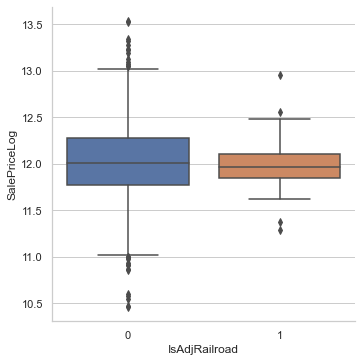

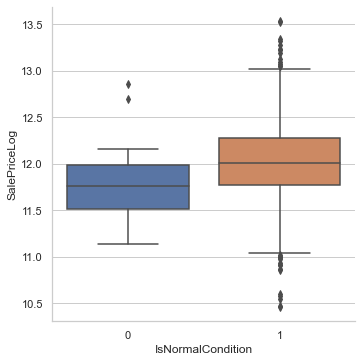

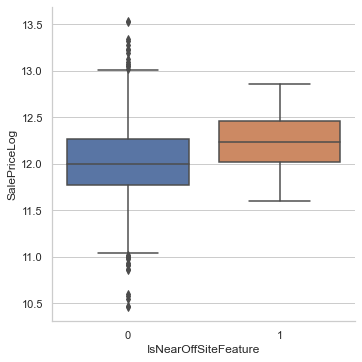

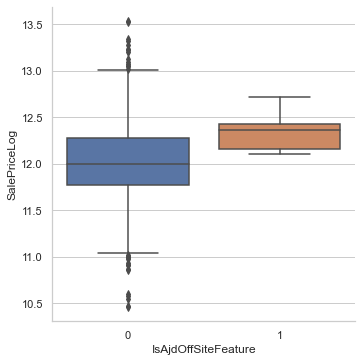

In [64]:
full_df['IsAdjArterialStreat'] = ((full_df['Condition1'] == 'Artery') | (full_df['Condition2'] == 'Artery')) * 1
full_df['IsAdjFeederStreat'] = ((full_df['Condition1'] == 'Feedr') | (full_df['Condition2'] == 'Feedr')) * 1
full_df['IsNormalCondition'] = ((full_df['Condition1'] == 'Norm') | (full_df['Condition2'] == 'Norm')) * 1
full_df['IsAjdOffSiteFeature'] = ((full_df['Condition1'] == 'PosA') | (full_df['Condition2'] == 'PosA')) * 1
full_df['IsNearOffSiteFeature'] = ((full_df['Condition1'] == 'PosN') | (full_df['Condition2'] == 'PosN')) * 1
full_df['IsNearRailroad'] = ((full_df['Condition1'].isin(['RRNn', 'RRNe'])) | (full_df['Condition2'].isin(['RRNn', 'RRNe']))) * 1
full_df['IsAdjRailroad'] = ((full_df['Condition1'].isin(['RRAn', 'RRAe'])) | (full_df['Condition2'].isin(['RRAn', 'RRAe']))) * 1

sns.catplot(data=full_df, x='IsAdjArterialStreat', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsAdjFeederStreat', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsNearRailroad', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsAdjRailroad', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsNormalCondition', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsNearOffSiteFeature', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsAjdOffSiteFeature', y='SalePriceLog', kind='box')

### Roof Properties



<img src="https://i.pinimg.com/originals/c7/88/e9/c788e90182e94319aecb6629ddfcede2.jpg" />

**Gable** and **hip** are two the most popular **roof styles** in the training set. The most popular **roof material** is composite shingles:

More Info:
- http://aroyalroofing.com/composite-shingles/
- https://www.cupapizarras.com/int/news/10-types-of-roofs/

<AxesSubplot:xlabel='count', ylabel='RoofMatl'>

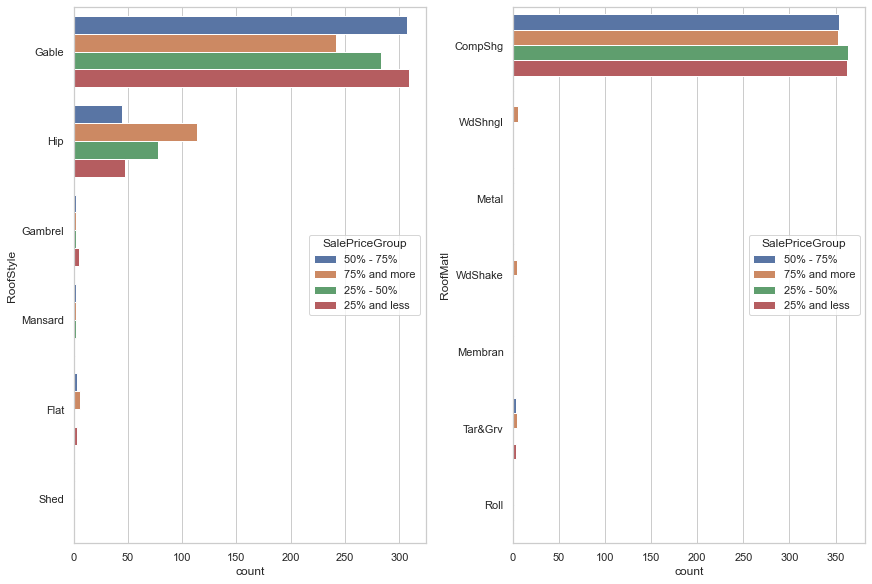

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='RoofStyle', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='RoofMatl', hue='SalePriceGroup', ax=ax[1])

**Roof material** correlates with house prices.

Here is an overview of roofing materials:
- **Composite Shingle** - organic or fiberglass base that is saturated with asphalt, coated on the bottom side with asphalt, and the exposed surface impregnated with small chips of slate, schist, quartz, or ceramic granules. **The most popular option** of all roofing materials (5 dollars/$ft^2$, 15-40 years lifetime) 
- **Wood Shingle** - made from thin, wedge-shaped pieces of natural wood, such as cedar or yellow pine, which are sawn from logs (8.25 dollars/$ft^2$, 25-30 years lifetime)
- **Roll Roofing** -  is made from large rolls of the same material used in composite shingles. It is frequently used in covering of sheds and small shops rather than houses (**2.5 dollars/$ft^2$**, 5-10 years lifetime)
- **Built-Up Roofing (Tar & Grv)** - a layered roof that is created by alternating layers of roofing felt and waterproof materials such as fiberglass, and hot tar (4 dollars/$ft^2$, 20-30 years lifetime)
- **Wood Shake** - thicker material than wood shingles, and they can be expected to stand up better than wood shingles to weather and UV rays (13 dollars/$ft^2$, 35-40 years)
- **Metal Roofing** - made from large steel panels laid on the roof deck with the seams overlapping in raised ridges that run vertically along the roof slope (13.6 dollars/$ft^2$, 30-50 years lifetime)
- **Clay Tile** - made from terracotta clay, but there are also ceramic tiles roofs (17.5 dollars/$ft^2$, 100 years lifetime)

**Wood** seem to be the most expensive material. 

More Info:
- https://www.inexroofingco.com/services/wood-shakes/
- https://nrc4help.com/tar-gravel-roof
- https://www.thespruce.com/rolled-roofing-1821945
- https://www.archtoolbox.com/materials-systems/thermal-moisture-protection/flat-roof-membranes.html
- https://www.diorconstruction.com/4-benefits-of-wood-shake-roofing/
- https://www.thespruce.com/best-roofing-materials-for-longevity-1821951

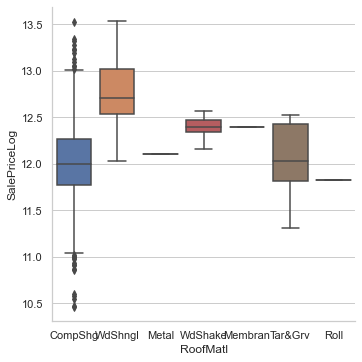

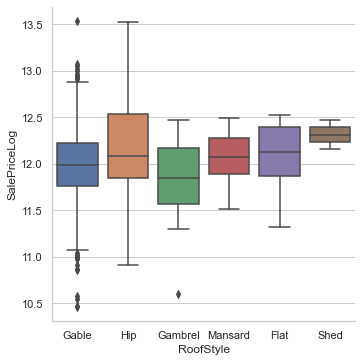

In [66]:
sns.catplot(data=full_df, x='RoofMatl', y='SalePriceLog', kind='box')

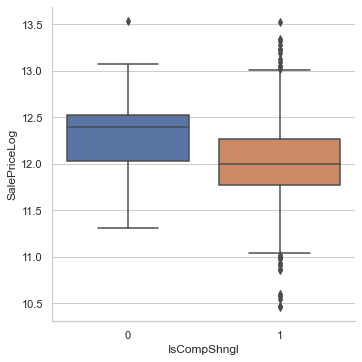

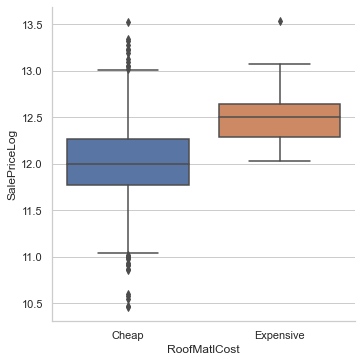

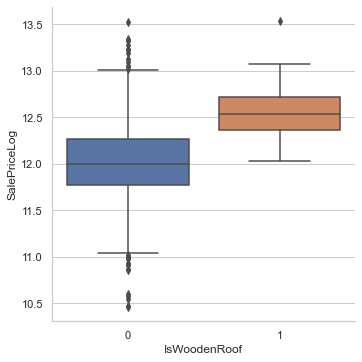

In [67]:
full_df['RoofMatlCost'] = full_df['RoofMatl'].map({
    'CompShg': 'Cheap',
    'WdShake': 'Expensive',
    'ClyTile': 'Expensive',
    'WdShngl': 'Expensive',
    'Roll': 'Cheap',
    'Metal': 'Expensive',
    'Membran': 'Cheap',
    'Tar&Grv': 'Cheap',
})

full_df['IsWoodenRoof'] = full_df['RoofMatl'].map({
    'CompShg': 0,
    'WdShake': 1,
    'ClyTile': 0,
    'WdShngl': 1,
    'Roll': 0,
    'Metal': 0,
    'Membran': 0,
    'Tar&Grv': 0,
})

full_df['IsCompShngl'] = full_df['RoofMatl'].map({
    'CompShg': 1,
    'WdShake': 0,
    'ClyTile': 0,
    'WdShngl': 0,
    'Roll': 0,
    'Metal': 0,
    'Membran': 0,
    'Tar&Grv': 0,
})

sns.catplot(data=full_df, x='IsCompShngl', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='RoofMatlCost', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsWoodenRoof', y='SalePriceLog', kind='box')

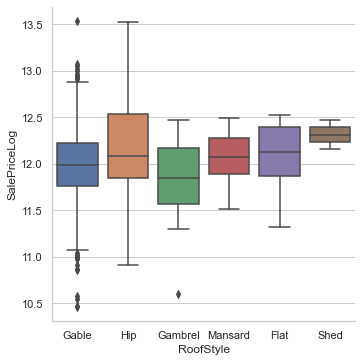

In [44]:
sns.catplot(data=full_df, x='RoofStyle', y='SalePriceLog', kind='box')

**Gable** and **hip** are the most popular choices. Let's group our house roof styles by popularity:

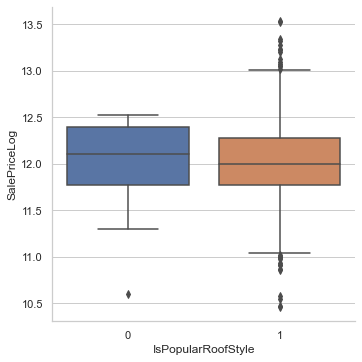

In [272]:
full_df['IsPopularRoofStyle'] = full_df['RoofStyle'].isin(['Hip', 'Gable']) * 1

sns.catplot(data=full_df, x='IsPopularRoofStyle', y='SalePriceLog', kind='box')

### House Exterior Properties

<img src="https://i.pinimg.com/originals/f7/89/62/f7896244b88d71a376c8bfb3f3a7d95f.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='Exterior2nd'>

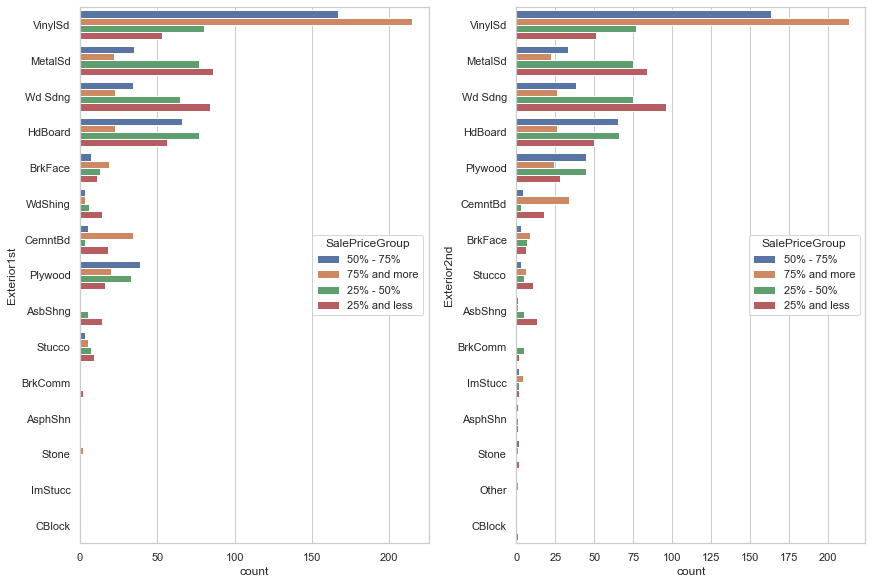

In [68]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="Exterior1st", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="Exterior2nd", hue="SalePriceGroup", ax=ax[1])

### Masonry Veneer

<img src="https://static.secure.website/wscfus/10286973/5368169/img-20170313-163056212-hdr-w1920-o.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='MasVnrType'>

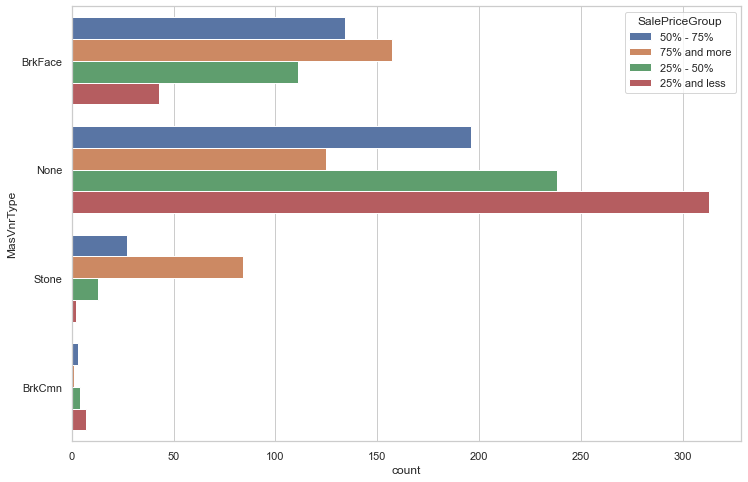

In [69]:
# ?
sns.countplot(data=full_df, y='MasVnrType', hue='SalePriceGroup')

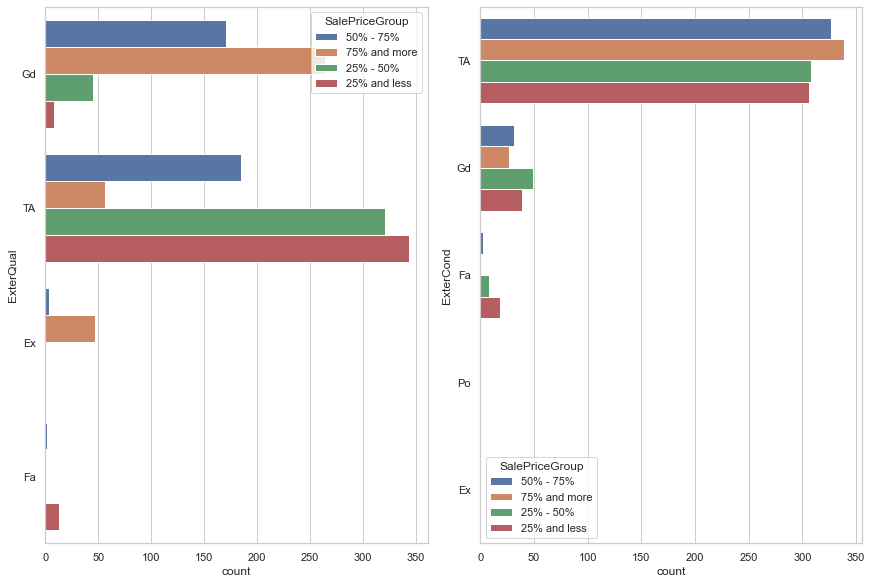

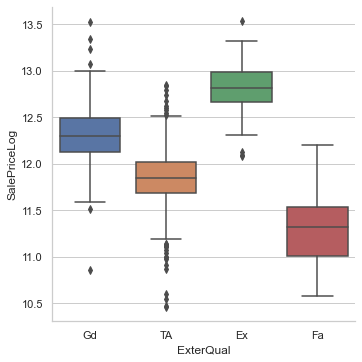

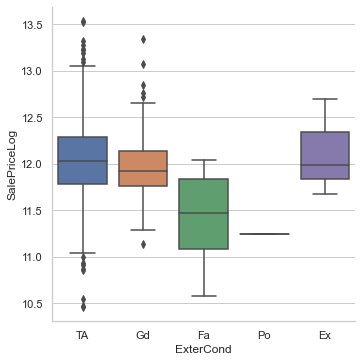

In [70]:
# Houses with SalePrice > 75% percentile have mostly good or excellent exterior quality. They also have average or good conditions.

## Houses with SalePrice < 50% percentile have mostly average quality and average condition.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='ExterQual', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='ExterCond', hue='SalePriceGroup', ax=ax[1])

sns.catplot(data=full_df, x='ExterQual', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='ExterCond', y='SalePriceLog', kind='box')

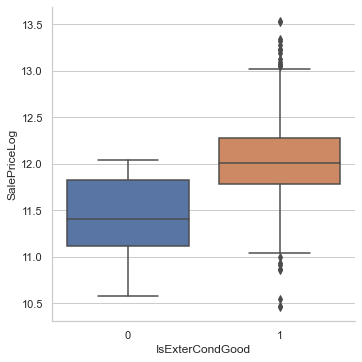

In [71]:
full_df['IsExterCondGood'] = full_df['ExterCond'].map({'Po': 0, 'Fa': 0, 'TA': 1, 'Gd': 1, 'Ex': 1})

sns.catplot(data=full_df, x='IsExterCondGood', y='SalePriceLog', kind='box')

### Heating, Air Condition and Electrical Systems, Utilities

<img src="https://www.longrefrigeration.com/wp-content/uploads/2018/01/Depositphotos_84681734_m-2015.jpg" width="600px" />

Heating Types does differentiate samples with sale price below the mean.

Wall, gravity, floor furneses and other heating were installed in houses that cheaper than 50% tier.

It seems like the mentioned heating systems are old fashion. 

Here is the YearBuilt ranges:
- Grav - 1910-1941
- Floor - 1949
- OthW - 1872-1917
- Wall - 1945-1952
- GasW - 1880-1970
- GasA - 1875-2010

Most houses with SalePrice > 50% have from excellent to average quality of heating. Lower quality types includes mostly houses from < 50% tier.

More Info: 
- https://www.nachi.org/gravity-furnace-inspection.htm
- https://www.billhowe.com/blog/what-is-wall-furnace
- https://sandium.com/hvac-technology/all-you-need-to-know-about-floor-furnace.html

<AxesSubplot:xlabel='count', ylabel='HeatingQC'>

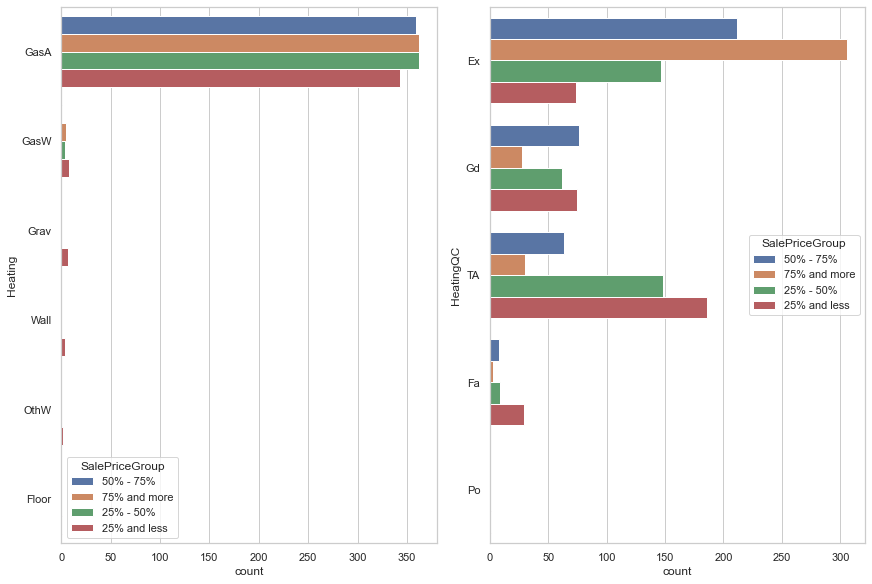

In [72]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='Heating', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='HeatingQC', hue='SalePriceGroup', ax=ax[1])

Based on this information, let's engineer new features that:
- indicate gas-based heating systems (modern type of heating)
- simplify heating ranking and introduce **IsHeatingGood** flag

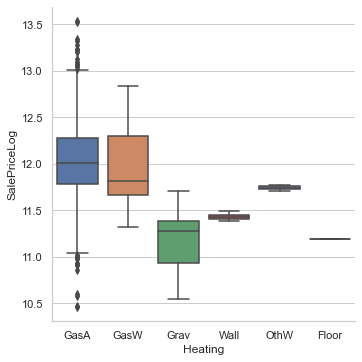

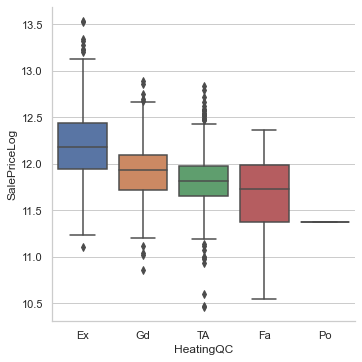

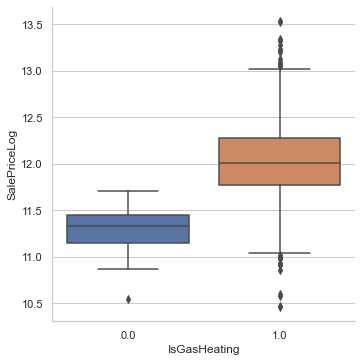

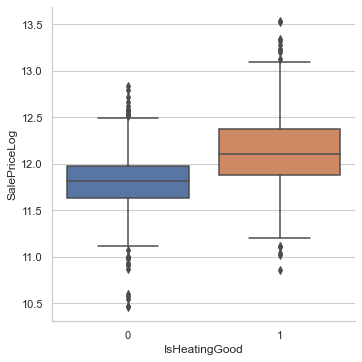

In [73]:
full_df['IsGasHeating'] = full_df['Heating'].map({'GasA': 1, 'GasW': 1, 'Grav': 0, 'Wall': 0, 'OtherW': 0, 'Floor': 0})
full_df['IsHeatingGood'] = full_df['HeatingQC'].map({'Po': 0, 'Fa': 0, 'TA': 0, 'Gd': 1, 'Ex': 1})

sns.catplot(data=full_df, x='Heating', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='HeatingQC', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsGasHeating', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsHeatingGood', y='SalePriceLog', kind='box')

**Central AC** seems to be an popular house feature. Most of the houses from >50% tier had it. It was not installed in cheap (<25% tier) houses.

More Info:
- https://www.thisoldhouse.com/heating-cooling/21018992/read-this-before-you-install-central-air-conditioning

Most of the houses have Standard Circuit Breakers type of **Electricity**. Houses from >50% tier dominates there. The rest of options (which is fuse boxes) are hold by <50% houses. Fuse Boxes were normally installed in old-built houses.

More Info:
- http://www.icanfixupmyhome.com/Understanding_Home_Wiring.html
- https://www.thespruce.com/fuses-and-fuse-boxes-101-4122558

<AxesSubplot:xlabel='count', ylabel='Electrical'>

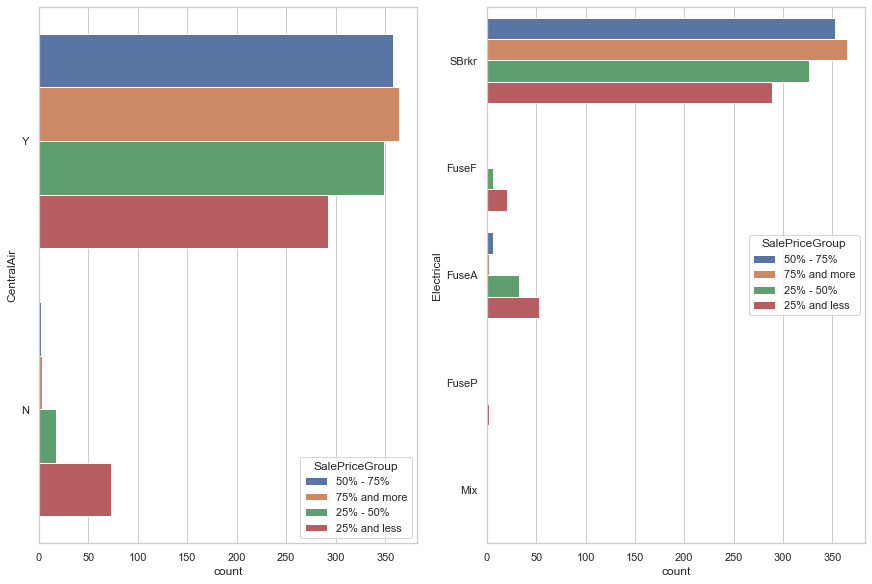

In [74]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='CentralAir', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='Electrical', hue='SalePriceGroup', ax=ax[1])

**Electrical** feature seems to have more information that we need. It can be reduced to a flag features that indicated whenever a house had modern electrical breakers or old-fashion fuse boxes:

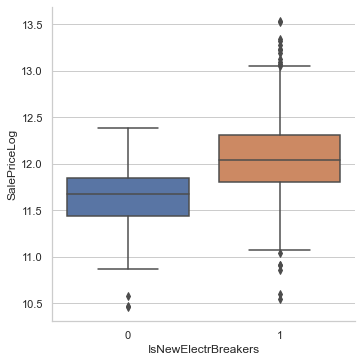

In [75]:
full_df['IsNewElectrBreakers'] = full_df['Electrical'].map({'SBrkr': 1, 'FuseF': 0, 'FuseA': 0, 'FuseP': 0, 'Mix': 0})

sns.catplot(data=full_df, x='IsNewElectrBreakers', y='SalePriceLog', kind='box')

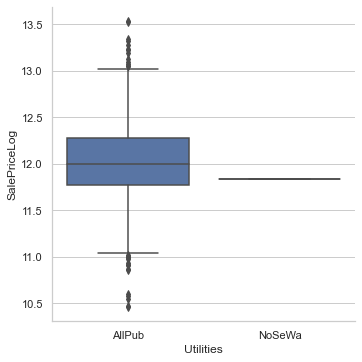

In [76]:
sns.catplot(data=full_df, x='Utilities', y='SalePriceLog', kind='box')

In [77]:
fullDf[fullDf['Utilities'] != 'AllPub']

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,...,IsNearOffSiteFeature,IsNearRailroad,IsAdjRailroad,RoofMatlCost,IsWoodenRoof,IsCompShngl,IsExterCondGood,IsGasHeating,IsHeatingGood,IsNewElectrBreakers
944,1344,0,0,None,3,1Fam,TA,No,111.0,354.0,...,0,0,0,Cheap,0,1,1,1.0,1,0


Most of the houses have "AllPub" **Utilities** feature has only one value in the dataset. There are a few NaN values and one "NoSeWa". It should be safe to drop this feature.

### Kitchen Properties

<img src="https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/ph163819-priority-1580934887.jpg" width="600px" />

**Kitchen** is an important part of any house. There two metrics that decribe lot kitchens:

<AxesSubplot:xlabel='count', ylabel='KitchenAbvGr'>

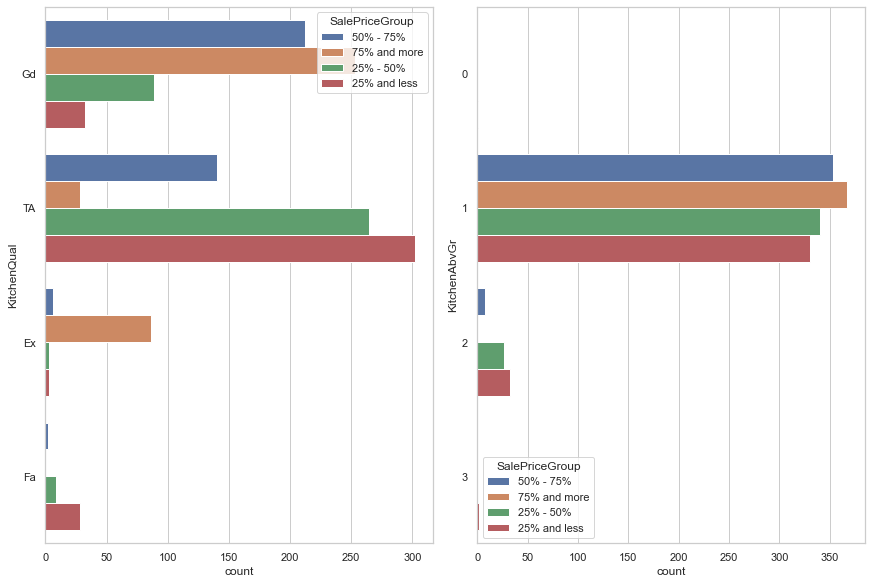

In [78]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='KitchenQual', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='KitchenAbvGr', hue='SalePriceGroup', ax=ax[1])

We can think about single metric to combine kitchen number and quality. With a help of binning, we can divide all houses into "Bad Quality" and "Good Quality" kitchens:

<AxesSubplot:xlabel='count', ylabel='KitchenQC'>

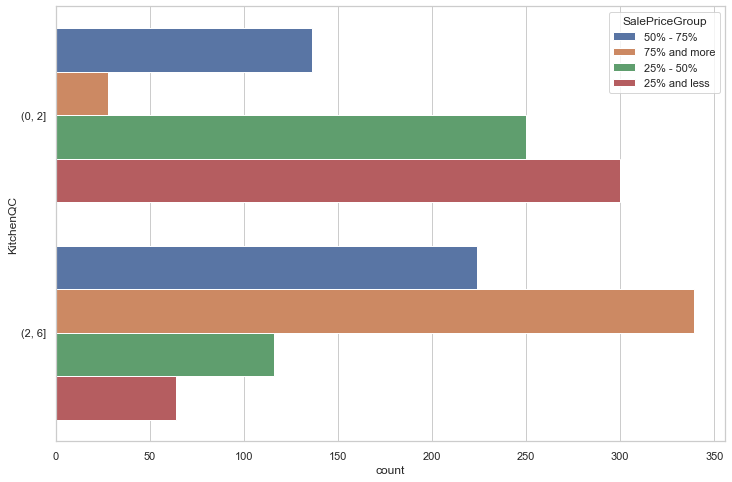

In [79]:
full_df['KitchenQC'] = pd.cut(full_df['KitchenQualEnc'] * full_df['KitchenAbvGr'], [0, 2, 6])

sns.countplot(data=full_df, y='KitchenQC', hue='SalePriceGroup')

### Bathroom Properties

<img src="https://na.rdcpix.com/953932278/9ab1219892c704d4811c173a86816eb4w-c0xd-w685_h860_q80.jpg" />

**Bathrooms** are also important and there two types of bathrooms: 
- full bathrooms - a sink, a shower, a bathtub, and a toilet
- and half bathrooms - a toilet and a sink only

Bathrooms can be located above ground or in the basement.

More Information: 
* https://www.realtor.com/advice/sell/if-i-take-out-the-tub-does-a-bathroom-still-count-as-a-full-bath
* https://www.thetruthaboutrealty.com/half-bath-vs-full-bath-wheres-the-value/

<AxesSubplot:xlabel='count', ylabel='BsmtHalfBath'>

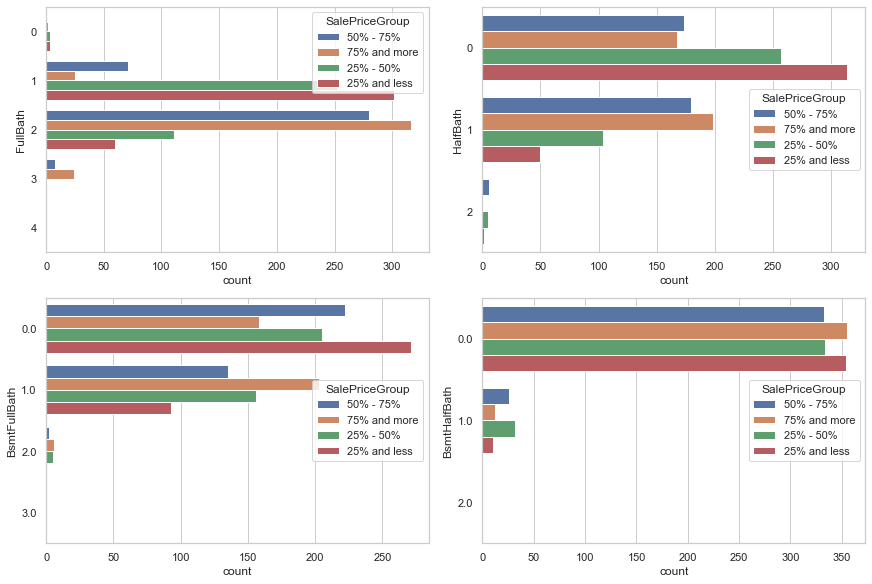

In [80]:
fig, ax = plt.subplots(2, 2, constrained_layout=True)

sns.countplot(data=full_df, y='FullBath', hue='SalePriceGroup', ax=ax[0, 0])
sns.countplot(data=full_df, y='HalfBath', hue='SalePriceGroup', ax=ax[0, 1])

sns.countplot(data=full_df, y='BsmtFullBath', hue='SalePriceGroup', ax=ax[1, 0])
sns.countplot(data=full_df, y='BsmtHalfBath', hue='SalePriceGroup', ax=ax[1, 1])

It's typical to say that house contains one and half bathrooms, so we can think about a simple sum of all bathrooms to describe a house:

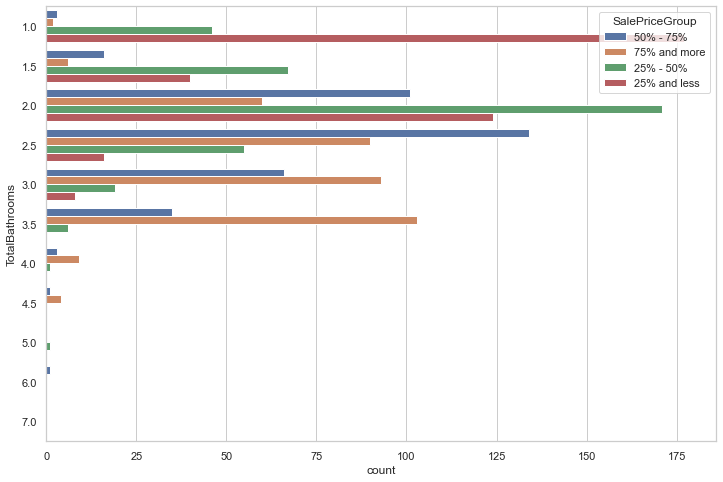

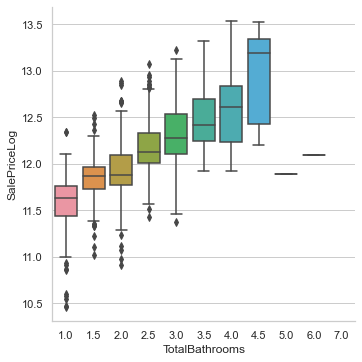

In [81]:
full_df['TotalBathrooms'] = full_df['FullBath'] + (0.5 * full_df['HalfBath']) + \
                                full_df['BsmtFullBath'] + (0.5 * full_df['BsmtHalfBath'])

sns.countplot(data=fullDf, y='TotalBathrooms', hue='SalePriceGroup')
sns.catplot(data=full_df, x='TotalBathrooms', y='SalePriceLog', kind='box')

Sinlge **TotalBathrooms** feature correlates well with **SalePrice**. Sure thing! Everyone wants to have a few bathrooms 😄

### Garage Properties

<img src="https://www.deldenmfg.com/images/homepage-slideshow/home5.jpg" width="600px" />

Attached and Builtin **garage types** dominate among expensive houses (>50% tier). Their garages commonly were built to contain 2 or 3 cars. 
Detached, CarPort types dominates among cheap houses (<50% tier). Their garage capacity is 1 car. No garages are also dominates among cheap houses.

<AxesSubplot:xlabel='count', ylabel='GarageCars'>

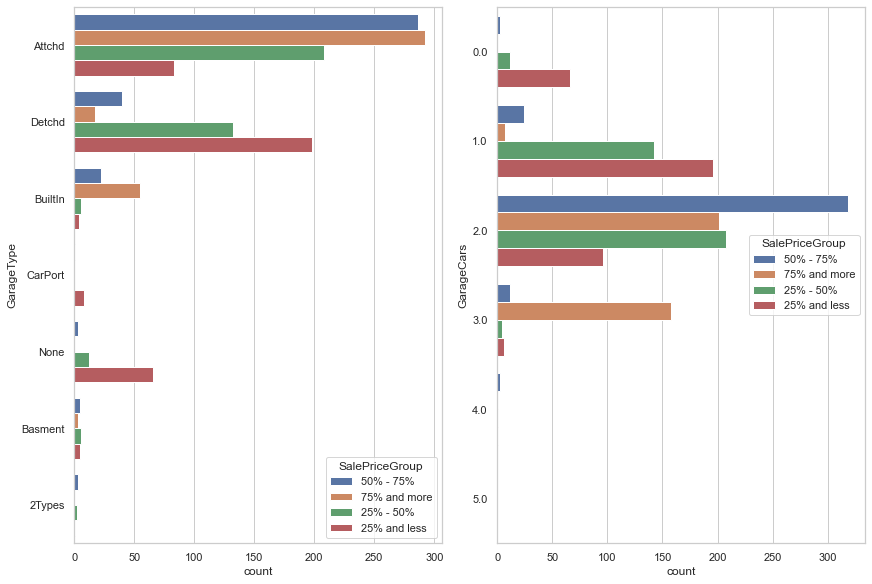

In [82]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=full_df, y='GarageType', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='GarageCars', hue='SalePriceGroup', ax=ax[1])

Also, we can see a correlation between **garage car** capacity and house **sale price**:

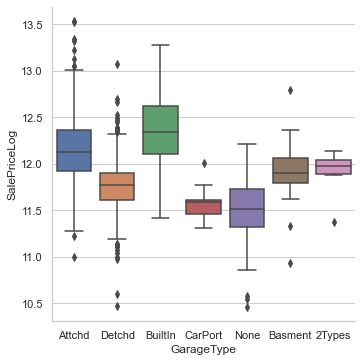

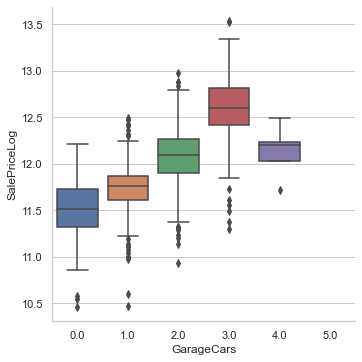

In [83]:
sns.catplot(data=full_df, x='GarageType', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='GarageCars', y='SalePriceLog', kind='box')

Most of garages were in **average** condition and quality:

<AxesSubplot:xlabel='count', ylabel='GarageCond'>

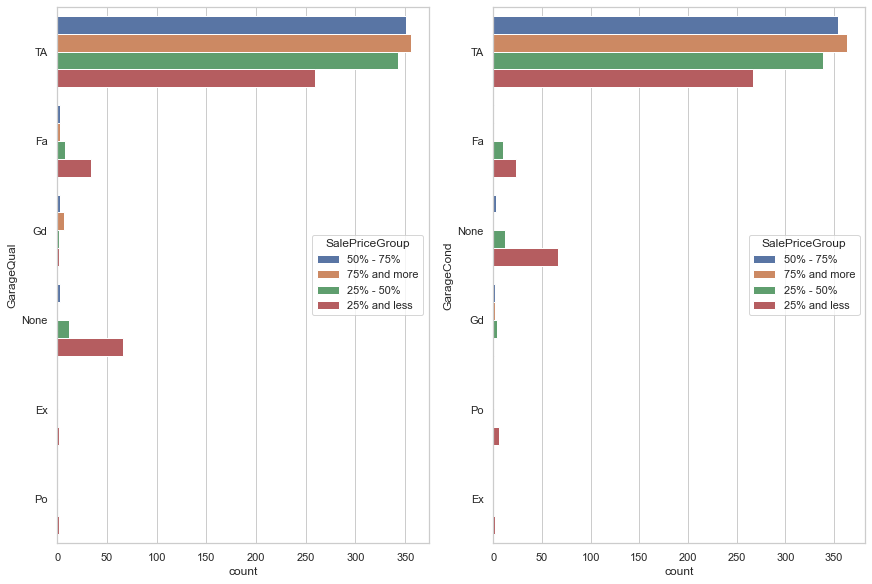

In [84]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='GarageQual', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='GarageCond', hue='SalePriceGroup', ax=ax[1])

To reduce noice in Garage Quality and Condition feature, we reduce them to flags:

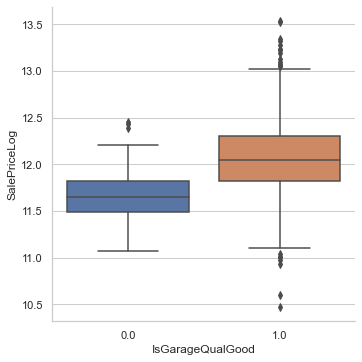

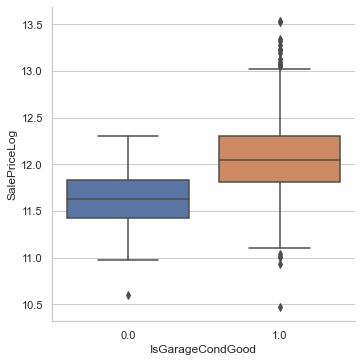

In [85]:
full_df['IsGarageCondGood'] = full_df['GarageCond'].map({'Po': 0, 'Fa': 0, 'TA': 1, 'Gd': 1, 'Ex': 1})
full_df['IsGarageQualGood'] = full_df['GarageQual'].map({'Po': 0, 'Fa': 0, 'TA': 1, 'Gd': 1, 'Ex': 1})

sns.catplot(data=full_df, x='IsGarageQualGood', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='IsGarageCondGood', y='SalePriceLog', kind='box')

**Finished Garages** were more expensive than unfinished ones. Most of the expensive houses (>50% tier) have finished garages or roughly finished. 

**Unfinished garages** were sold with cheap houses (<50% tier).

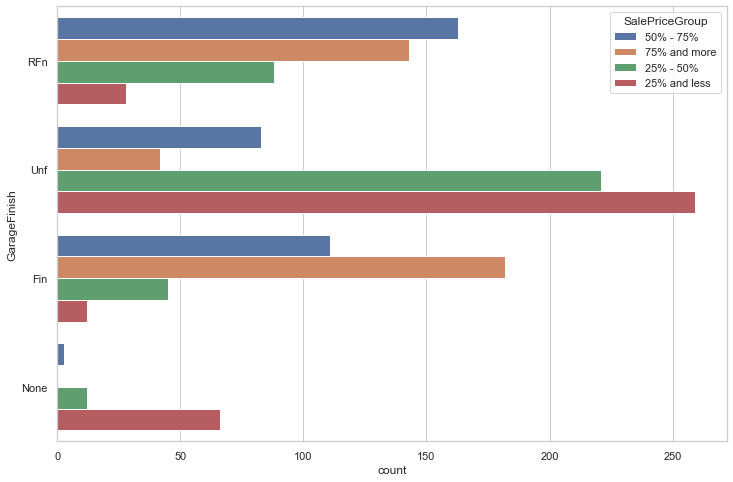

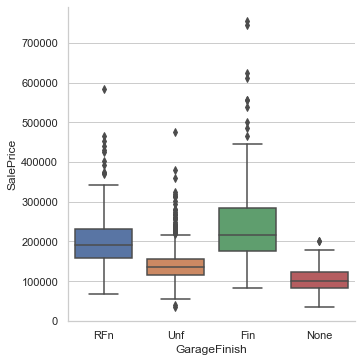

In [86]:
sns.countplot(data=full_df, y='GarageFinish', hue='SalePriceGroup')
sns.catplot(data=full_df, x='GarageFinish', y='SalePrice', kind='box')

**Garage area** correlates with **SalePrice**:

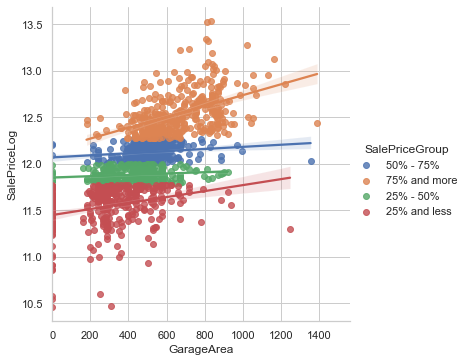

In [87]:
sns.lmplot(data=full_df, x='GarageArea', y='SalePriceLog', hue='SalePriceGroup')

### Wood Deck

<img src="https://padeckbuilder.com/wp-content/uploads/2016/03/Cumaru-deck.jpg" width="600px" />

**Deck** is a platform built above the ground and connected to the main building. The average deck area is between 200-300 $ft^2$.

More Info:
- https://www.landscapingnetwork.com/decks/size.html

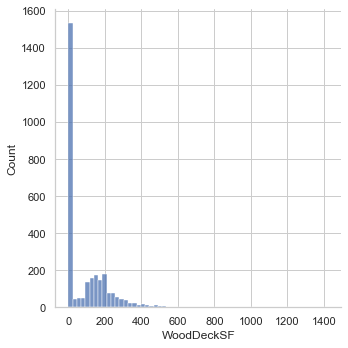

In [88]:
sns.displot(full_df['WoodDeckSF'])

Most of the houses did not have wooden decks. Since we don't have any other information except deck area, we can categorize all decks by size:

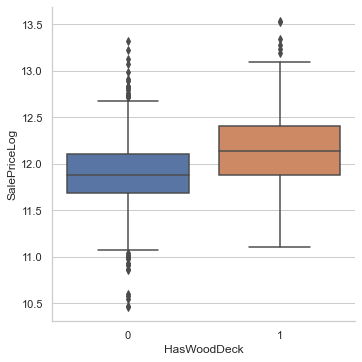

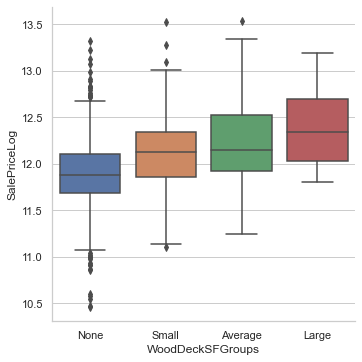

In [119]:
full_df['HasWoodDeck'] = (full_df['WoodDeckSF'] > 0) * 1
full_df['WoodDeckGroups'] = pd.cut(full_df['WoodDeckSF'], bins=[-1, 1, 200, 500, 2000], labels=['None', 'Small', 'Average', 'Large'])

sns.catplot(data=full_df, x='HasWoodDeck', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='WoodDeckGroups', y='SalePriceLog', kind='box')

**WoodDeckGroups** gives more information about price distribution then **HasWoodDeck**  flag.

### Porch

**Porch** is a room or gallery located in front of an entrance of a building. Our training dataset has the whole four types of porches:
- Open Porch
- Enclosed Porch
- Three Season Porch
- Screen Porch

From the distribution plots, we can see that **open porch** is the **most common** type and **three season** one is the **most rare**. Also, most of homes had one porch and 317 lots had 2 porches and only 5 houses had 3 porches:

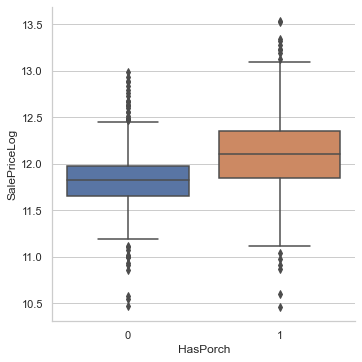

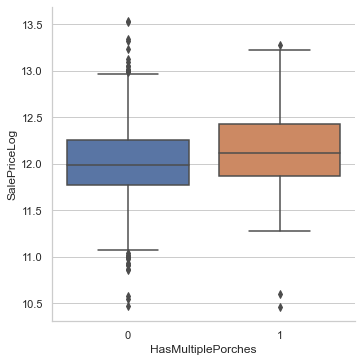

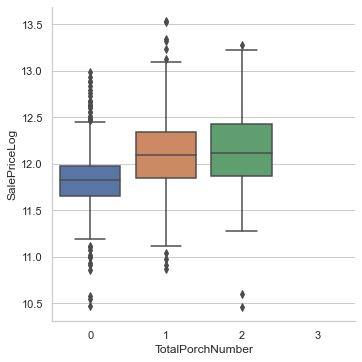

In [136]:
full_df['TotalPorchNumber'] = (full_df['OpenPorchSF'] > 0) * 1 +(full_df['EnclosedPorch'] > 0) * 1 + (full_df['3SsnPorch'] > 0) * 1 + (full_df['ScreenPorch'] > 0) * 1
full_df['HasPorch'] = (full_df['TotalPorchNumber'] > 0) * 1
full_df['HasMultiplePorches'] = (full_df['TotalPorchNumber'] > 1) * 1

sns.catplot(data=full_df, x='HasPorch', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='HasMultiplePorches', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='TotalPorchNumber', y='SalePriceLog', kind='box')

#### Open Porch
<img src="https://imagesvc.meredithcorp.io/v3/mm/image?url=https%3A%2F%2Fstatic.onecms.io%2Fwp-content%2Fuploads%2Fsites%2F24%2F2017%2F03%2Fbefore-after-porch-outdoor-living-room-porch-2395402-1.jpg&q=85" width="600px" />

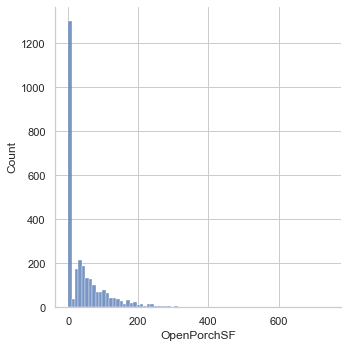

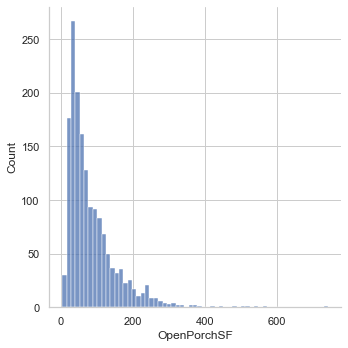

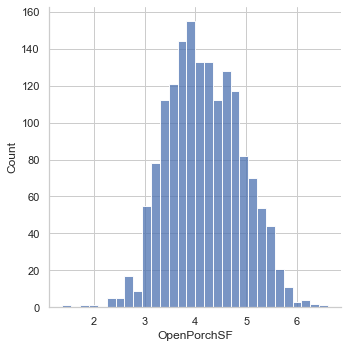

In [137]:
sns.displot(full_df['OpenPorchSF'])
sns.displot(full_df[full_df['OpenPorchSF'] > 0]['OpenPorchSF'])
sns.displot(np.log(full_df[full_df['OpenPorchSF'] > 0]['OpenPorchSF']))

In [138]:
full_df[full_df['OpenPorchSF'] > 0]['OpenPorchSF'].describe()

count    1619.000000
mean       85.185917
std        69.913548
min         4.000000
25%        38.500000
50%        63.000000
75%       110.000000
max       742.000000
Name: OpenPorchSF, dtype: float64

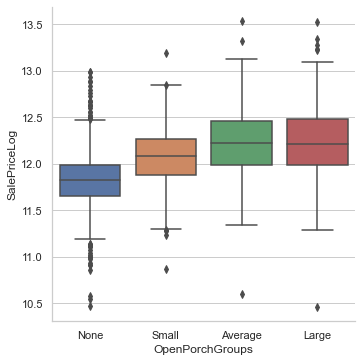

In [156]:
full_df['OpenPorchGroups'] = pd.cut(full_df['OpenPorchSF'], bins=[-1, 1, 40, 70, 1000], labels=['None', 'Small', 'Average', 'Large'])

sns.catplot(data=full_df, x='OpenPorchGroups', y='SalePriceLog', kind='box')

#### Enclosed Porch

<img src="https://media.angieslist.com/s3fs-public/styles/widescreen_large/public/porch.jpg?itok=yX_vZdbw" width="600px" />

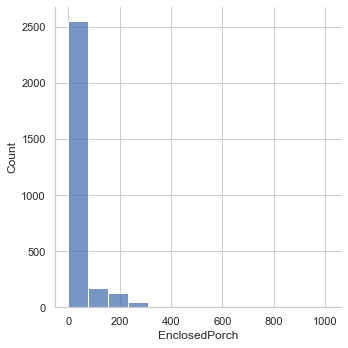

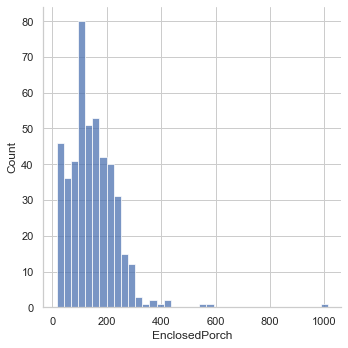

In [130]:
# https://www.medfordoregonroofers.com/blog/construction-services/what-are-the-benefits-of-enclosed-porches/

sns.displot(full_df['EnclosedPorch'])
sns.displot(full_df[full_df['EnclosedPorch'] > 0]['EnclosedPorch'])

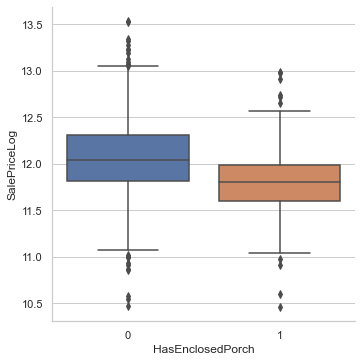

In [152]:
full_df['HasEnclosedPorch'] = (full_df['EnclosedPorch'] > 0) * 1

sns.catplot(data=full_df, x='HasEnclosedPorch', y='SalePriceLog', kind='box')

#### Three Season Porch

<img src="https://lecybros.com/wp-content/uploads/2018/01/photo-009.jpg?fd06b2" width="600px" />

A **three season porch** is an enclosed addition to a house, and is oftentimes called a sun room. Unlike a four season porch, the three season porch is not insulated (it might be chilly to be there in winter).

More Info:
- https://northfieldconstruction.com/tips-for-building-a-three-season-porch/

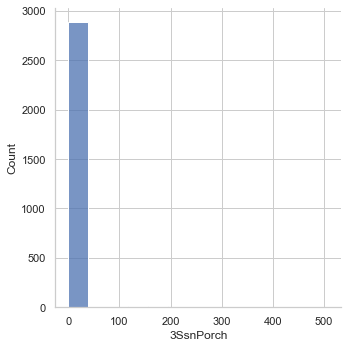

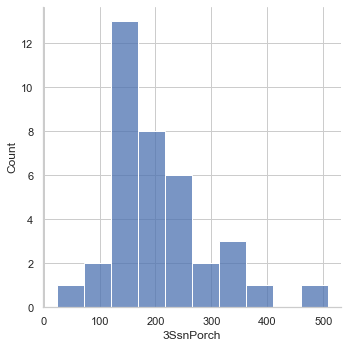

In [127]:
sns.displot(full_df['3SsnPorch'])
sns.displot(full_df[full_df['3SsnPorch'] > 0]['3SsnPorch'])

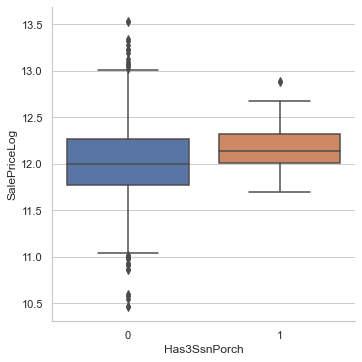

In [150]:
full_df['Has3SsnPorch'] = (full_df['3SsnPorch'] > 0) * 1

sns.catplot(data=full_df, x='Has3SsnPorch', y='SalePriceLog', kind='box')

#### Screen Porch

<img src="https://cdnassets.hw.net/65/55/7098b3b74a659c0e0e47e2a48822/figure-00.jpg" width="600px" />

A **screened porch** is a type of porch on or near the exterior of a house that has been covered by window screens in order to hinder insects, debris, and other undesirable objects from entering the area inside the screen

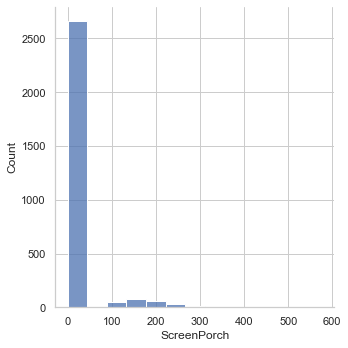

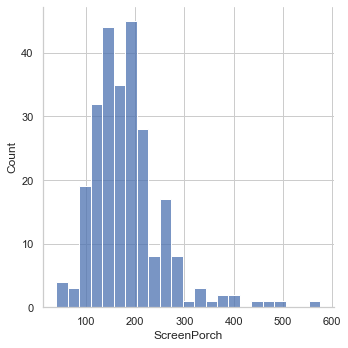

In [129]:
sns.displot(full_df['ScreenPorch'])
sns.displot(full_df[full_df['ScreenPorch'] > 0]['ScreenPorch'])

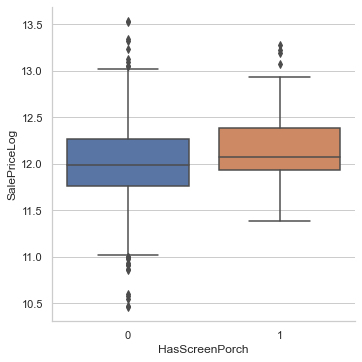

In [151]:
full_df['HasScreenPorch'] = (full_df['ScreenPorch'] > 0) * 1

sns.catplot(data=full_df, x='HasScreenPorch', y='SalePriceLog', kind='box')

### Fireplaces
<img src="https://www.fpwhs.com/shop/wp-content/uploads/Skope-E135-LOW.jpg" width="600px" />

Most of the cheap houses (<50%) don't have fireplaces or have one (most of the them are good or below avarage quality). Most of the expensive houses have 1 or 2 fireplaces with excellent, good or average quality.

<AxesSubplot:xlabel='count', ylabel='FireplaceQu'>

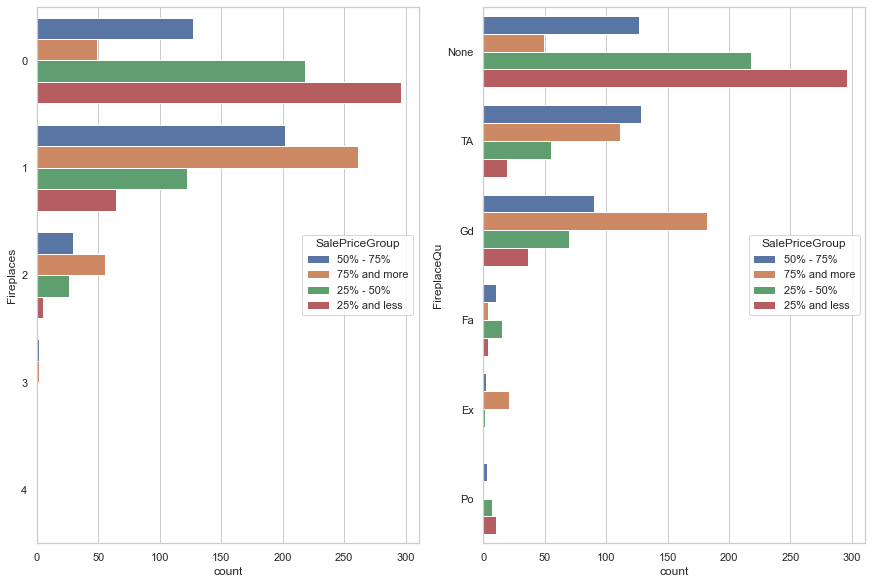

In [90]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="Fireplaces", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="FireplaceQu", hue="SalePriceGroup", ax=ax[1])

### Pool
<img src="https://upload.wikimedia.org/wikipedia/commons/9/92/Backyardpool.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='PoolQC'>

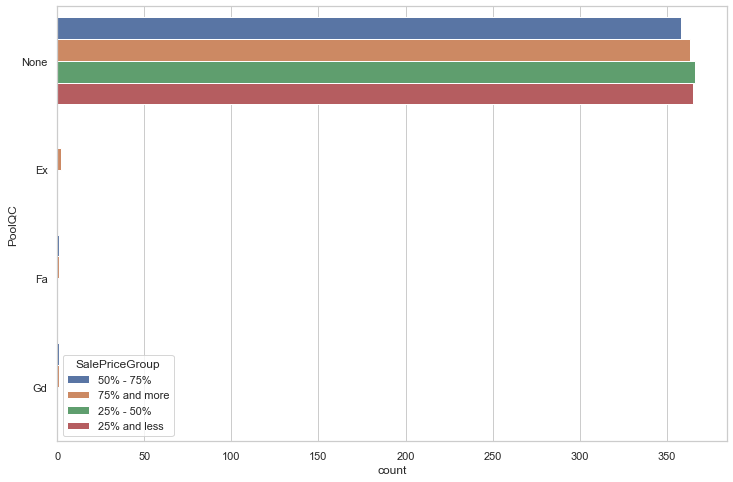

In [91]:
# Just a few lots have pools. None of houses that are cheaper than 25% have pools.
# There is an outlier with SalePrice < 50% and pool installed

sns.countplot(data=full_df, y='PoolQC', hue='SalePriceGroup')

In [92]:
# Outlier

fullDf[(fullDf["SalePriceGroup"] == "25% - 50%") & (fullDf["PoolQC"] == 'Gd')][[
    'SalePrice',
    'PoolQC',
    'PoolArea',
    'TotRmsAbvGrd',
    'LotArea',
    'GrLivArea',
    'Neighborhood',
]]

,SalePrice,PoolQC,PoolArea,TotRmsAbvGrd,LotArea,GrLivArea,Neighborhood


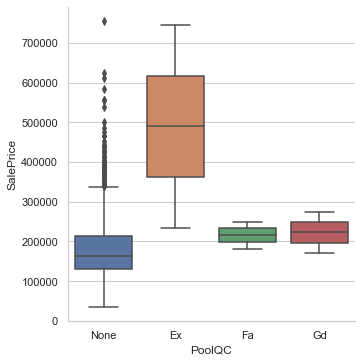

In [93]:
# ?
sns.catplot(data=fullDf, x="PoolQC", y="SalePrice", kind="box")

### Fence

<img src="https://irp-cdn.multiscreensite.com/953fb570/dms3rep/multi/fence-installation-repair-services.jpg" width="600px" />

<AxesSubplot:xlabel='count', ylabel='Fence'>

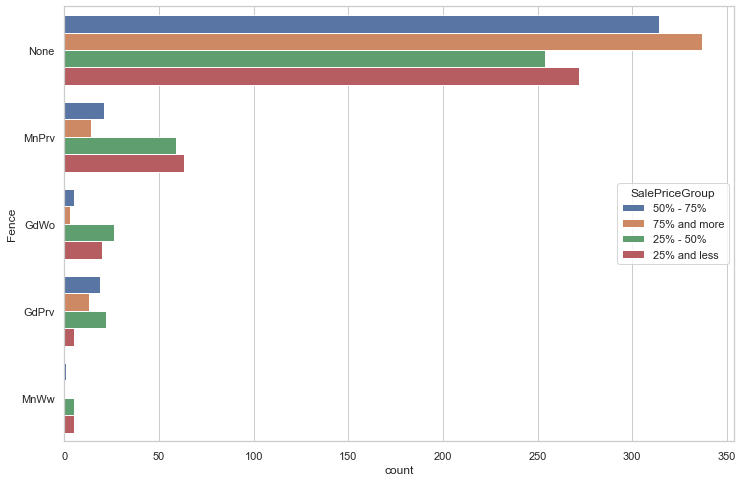

In [94]:
# Expensive houses (>50%) have good privacy/wood fences. Cheap houses (<50%) have minimal privacy/wood fences.

sns.countplot(data=fullDf, y="Fence", hue="SalePriceGroup")

### Misc Features

<img src="https://www.homebase.co.uk/-/media/uk%20images/homebase/ideas%20and%20advice/garden%20and%20outdoor/shed%20garden%20buildings%20and%20storage/how%20to%20build%20a%20shed/h2-build-a-shed-header-image-960x480.jpeg" width="600px" />

Houses might have additional valuable features that are described in **MiscX** columns:
- Shed (over 100 $ft^2$, +$500 on avg)
- Second Garage (+$8300 on avg)
- Tenis Court (+$2k on avg)
- Other Features (+$3250 on avg) 

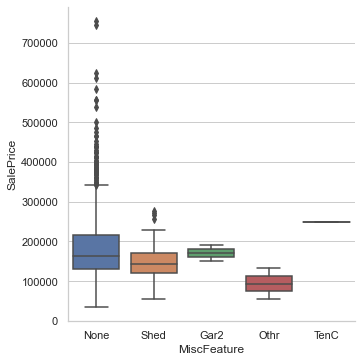

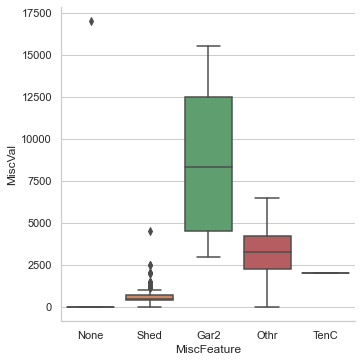

In [185]:
sns.catplot(data=full_df, x='MiscFeature', y='SalePrice', kind='box')
sns.catplot(data=full_df, x='MiscFeature', y='MiscVal', kind='box')

In [203]:
full_df['Shed'] = (full_df['MiscFeature'] == 'Shed') * 1 * full_df['MiscVal']
full_df['2ndGarage'] = (full_df['MiscFeature'] == 'Gar2') * 1 * full_df['MiscVal']
full_df['TenisCourt'] = (full_df['MiscFeature'] == 'TenC') * 1 * full_df['MiscVal']
full_df['OtherFeature'] = (full_df['MiscFeature'] == 'Othr') * 1 * full_df['MiscVal']

### Sale Information

In [43]:
full_df['YrSold'].unique()

array(['2008', '2007', '2006', '2009', '2010'], dtype=object)

<AxesSubplot:xlabel='count', ylabel='SaleCondition'>

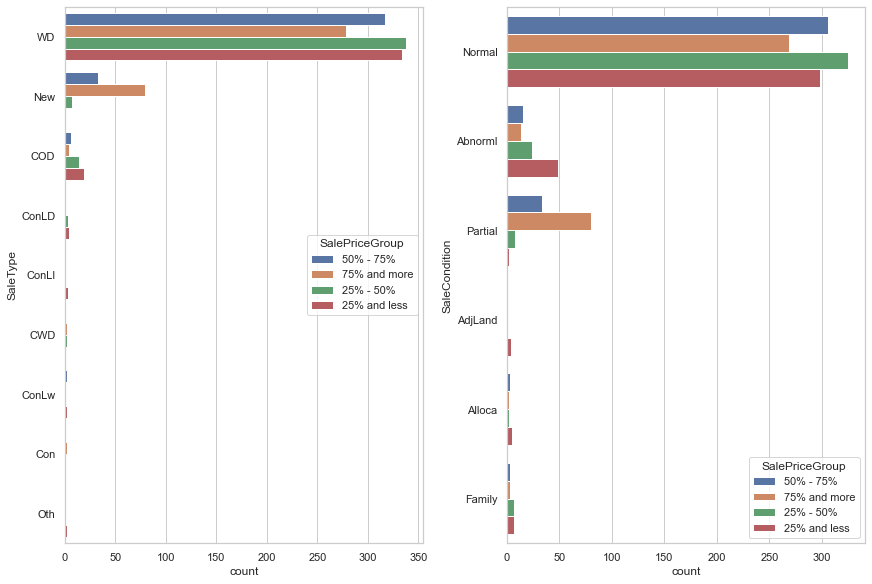

In [96]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=full_df, y='SaleType', hue='SalePriceGroup', ax=ax[0])
sns.countplot(data=full_df, y='SaleCondition', hue='SalePriceGroup', ax=ax[1])

<AxesSubplot:xlabel='MoSold,YrSold'>

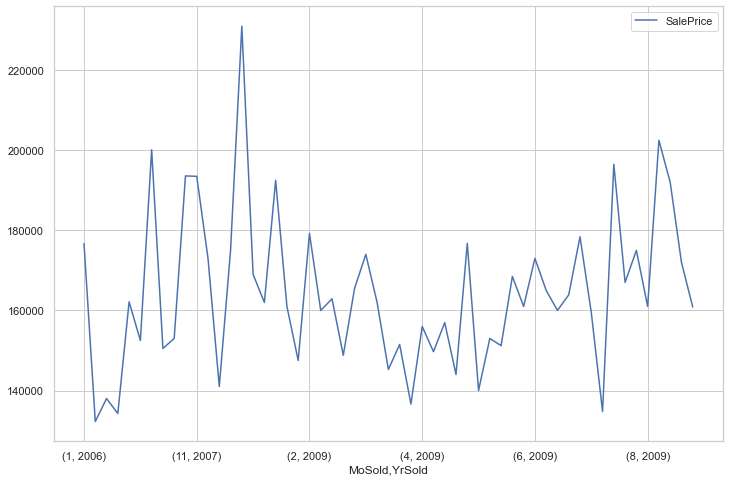

In [220]:
full_df.groupby(['MoSold', 'YrSold'])[['SalePrice']].median().plot()

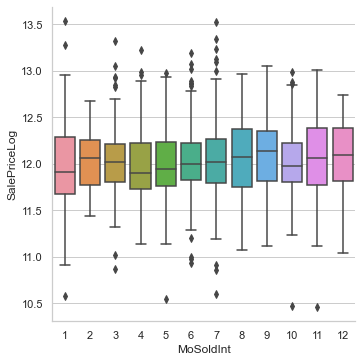

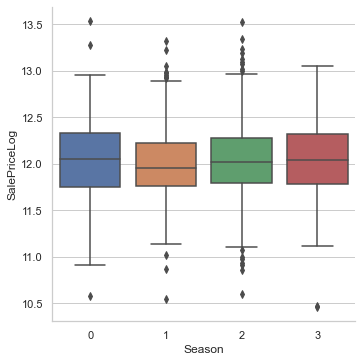

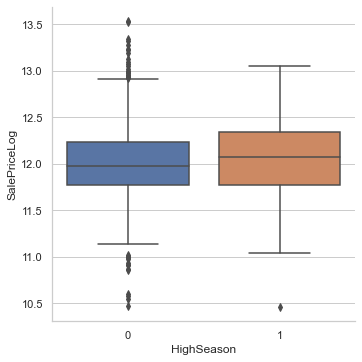

In [229]:
dataframe['MoSoldInt'] = dataframe['MoSold'].astype(int)

full_df['Season'] = full_df['MoSold'].map({
    '12': 0, '1': 0, '2': 0,
    '3': 1, '4': 1, '5': 1, 
    '6': 2, '7': 2, '8': 2, 
    '9': 3, '10': 3, '11': 3,
})

full_df['HighSeason'] = full_df['MoSold'].map({
    '12': 1, '1': 0, '2': 1,
    '3': 0, '4': 0, '5': 0, 
    '6': 0, '7': 0, '8': 1, 
    '9': 1, '10': 0, '11': 1,
})

sns.catplot(data=full_df, x='MoSoldInt', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='Season', y='SalePriceLog', kind='box')
sns.catplot(data=full_df, x='HighSeason', y='SalePriceLog', kind='box')

## Feature Engineering

Now we need to help our models to reveal more complex relations between house components and SalePrice. Let's start from simple flags that indicate whenever a house has:
* 2nd floor
* Basement
* Garage
* Pool
* Porch
* Fence
* Fireplace
* Masonry Veneer

In [98]:
engineered_df = pd.DataFrame()

engineered_df['Has2ndFloor'] = train_df['2ndFlrSF'].apply(lambda x: int(x > 0))
engineered_df['HasBsmnt'] = train_df['TotalBsmtSF'].apply(lambda x: int(x > 0))
engineered_df['HasGarage'] = train_df['GarageArea'].apply(lambda x: int(x > 0))
engineered_df['HasPool'] = train_df['PoolArea'].apply(lambda x: int(x > 0))
engineered_df['HasFence'] = train_df['Fence'].apply(lambda x: int(x != 'None'))
engineered_df['HasFireplace'] = train_df['Fireplaces'].apply(lambda x: int(x > 0))
engineered_df['HasMasVnr'] = train_df['MasVnrType'].apply(lambda x: int(x != 'None'))

Many house components have quality and condition metrics. Let's try to come up with a simple metrics that describes quantity-quality of components:

House itself and garage have specified years when they were built and/or renovate. This can help us to calculate how old they were at the time of sale:

In [99]:
engineered_df['HouseAge'] = train_df['YrSold'].astype('int') - train_df['YearBuilt'].astype('int')
engineered_df['HouseAgeSinRemod'] = train_df['YrSold'].astype('int') - train_df['YearRemodAdd'].astype('int')

Let's also create location interactions as they are important properties of each lot:

In [100]:
# TBA

In [208]:
engineered_features = list(engineered_df.columns.values)

train_df = train_df.join(engineered_df)

ValueError: columns overlap but no suffix specified: Index(['Has2ndFloor', 'HasBsmnt', 'HasGarage', 'HasPool', 'HasFence',
       'HasFireplace', 'HasMasVnr', 'HouseAge', 'HouseAgeSinRemod'],
      dtype='object')

## Feature Correlations

Before we go deep into feature relations, let's have an overview of feature correlations and importance (and specifically correlations with SalePrice):

<AxesSubplot:>

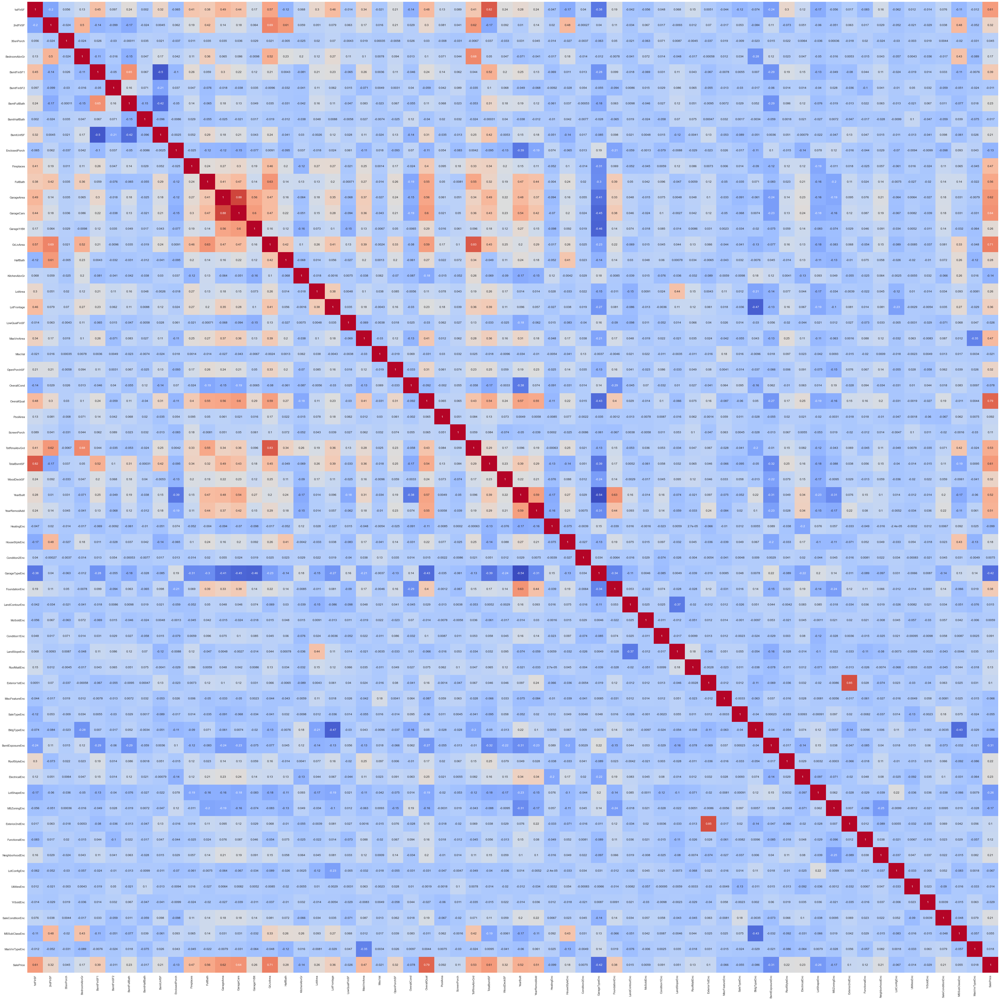

In [102]:
corr_features = num_features + enc_cat_features

plt.figure(figsize=(80, 70))
sns.heatmap(train_df[corr_features + ['SalePrice']].corr(), annot=True, square=True, cmap='coolwarm', cbar=False)

ANOVA Results:

<AxesSubplot:xlabel='feature', ylabel='score'>

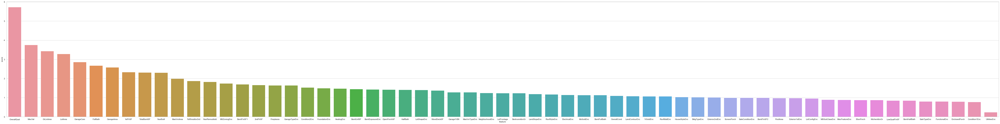

In [103]:
from sklearn.feature_selection import SelectKBest, SelectFromModel, f_classif

anova_feature_selector = SelectKBest(f_classif, k='all')
anova_feature_selector.fit(train_df[corr_features], train_df['SalePrice'])

anova_feature_importance_df = pd.DataFrame({'feature': corr_features, 'score': anova_feature_selector.scores_})
anova_feature_importance_df.sort_values(by=['score'], ascending=[0], inplace=True)

plt.figure(figsize=(100, 12))
sns.barplot(data=anova_feature_importance_df, x='feature', y='score')

Random Forest Selector Results:

In [104]:
from sklearn.ensemble import RandomForestRegressor

random_forest_regressor = RandomForestRegressor(
    max_depth=15,
    n_estimators=1000,
)

features = num_features + enc_cat_features + engineered_features

rf_selector = SelectFromModel(random_forest_regressor, max_features=30)
rf_selector.fit(train_df[features], train_df['SalePrice'])

temp_X = rf_selector.transform(train_df[features])

selected_features = pd.DataFrame(rf_selector.inverse_transform(temp_X), 
                                 index=train_df[features].index,
                                 columns=train_df[features].columns)

selected_columns = selected_features.columns[selected_features.var() != 0]
selected_columns

Index(['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'GarageArea', 'GarageCars',
       'GrLivArea', 'OverallQual', 'TotalBsmtSF'],
      dtype='object')

Lasso Selector Results:

In [105]:
from sklearn.linear_model import LassoCV

l1_regressor = LassoCV(
    alphas=[0.1, 0.2, 0.4, 0.6, 0.8, 1],
    n_jobs=-1,
    random_state=42,
)

l1_selector = SelectFromModel(l1_regressor, max_features=30)
l1_selector.fit(train_df[features], train_df['SalePrice'])

temp_X = l1_selector.transform(train_df[features])

selected_features = pd.DataFrame(l1_selector.inverse_transform(temp_X), 
                                 index=train_df[features].index,
                                 columns=train_df[features].columns)

selected_columns = selected_features.columns[selected_features.var() != 0]
selected_columns

Index(['BedroomAbvGr', 'BsmtFullBath', 'BsmtHalfBath', 'Fireplaces',
       'FullBath', 'GarageCars', 'HalfBath', 'KitchenAbvGr', 'OverallCond',
       'OverallQual', 'TotRmsAbvGrd', 'HeatingEnc', 'HouseStyleEnc',
       'Condition2Enc', 'FoundationEnc', 'LandSlopeEnc', 'RoofMatlEnc',
       'BldgTypeEnc', 'BsmtExposureEnc', 'RoofStyleEnc', 'FunctionalEnc',
       'UtilitiesEnc', 'SaleConditionEnc', 'MasVnrTypeEnc', 'Has2ndFloor',
       'HasBsmnt', 'HasGarage', 'HasPool', 'HasFireplace', 'HasMasVnr'],
      dtype='object')

Spearman Correlation Results:

In [ ]:
price_corr_df = pd.DataFrame()
price_corr_df['feature'] = corr_features
price_corr_df['corralation'] = [train_df[feature].corr(train_df['SalePrice'], 'spearman') for feature in corr_features]
price_corr_df.sort_values('corralation', ascending=[0], inplace=True)

plt.figure(figsize=(6, 0.25 * len(features)))
sns.barplot(data=price_corr_df, x='corralation', y='feature', orient='h')